# EDA: Part 1 -- Cohort 1 Wave 2

## Outline of EDA:

1. Prepare X and Y datasets


2. Univariate Analysis    
    
    - Visualizing Distributions:
    
        - Demographics
    
        - Features (Services)
        
        - Targets (Outcomes)        


3. Bivariate Analysis

    - Visualizing and Hypothesis Testing: 
    
        Relationships between:
    
        - Demographics and Features
        
        - Demographics and Targets
        
        - Features and Targets
        
##### For EDA highlights, check out my blog post at: 


In [2]:
# Loading needed libraries and tools...

import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
import math
import psycopg2 as psy
from sqlalchemy import create_engine
from sqlalchemy.engine.url import URL
import pandas.io.sql as psql
import seaborn as sns
from sklearn import preprocessing
from scipy.stats import chi2_contingency

%matplotlib inline


In [3]:
# Loading data from local postgres DB...

In [8]:
connection = psy.connect("dbname=nytd_clean_data user=cguy")

cohort_1 = psql.read_sql("SELECT * FROM cohort1_wave2", connection)

In [11]:
cohort_1 = cohort_1.drop('index',axis=1)
cohort_1.describe()

,Unnamed: 0,FY,StFIPS,Sex,AmIAKN,Asian,BlkAfrAm,HawaiiPI,White,RaceUnkn,...,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Race,RaceEthn,AgeMP
count,7354.000000,7354.0,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,...,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.000000,7354.00000,7354.000000,7354.000000
mean,10813.737014,2011.0,24.421539,1.507615,0.042970,0.014278,0.337775,0.005847,0.572750,0.444928,...,3.354229,3.281208,3.177047,3.034539,3.044874,3.088251,3.159097,9.12755,3.937313,16.571118
std,5913.043119,0.0,16.349738,0.499976,0.202803,0.118642,0.472984,0.076248,0.494713,5.733890,...,14.742194,14.756146,14.775400,14.800515,14.798741,14.791215,14.778642,25.87891,11.332458,0.495225
min,1.000000,2011.0,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,1.000000,16.000000
25%,6220.500000,2011.0,8.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,1.000000,16.000000
50%,10551.000000,2011.0,22.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,2.000000,17.000000
75%,16000.750000,2011.0,37.000000,2.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.00000,3.000000,17.000000
max,21205.000000,2011.0,56.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,77.000000,...,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,99.00000,99.000000,18.000000


In [12]:
cohort_1.Wave.value_counts()

Wave 2: Age 19 Followup    7354
Name: Wave, dtype: int64

# 1) Examine data and create X and Y datasets: 

In [13]:
# Dropping outcomes that are not needed for this analysis:

cohort_1 = cohort_1.drop(['SocSecrty','EducAid','Children','Marriage'], axis=1)

In [14]:
cohort_1.columns

Index([u'Unnamed: 0', u'Wave', u'StFCID', u'RepDate_outcomes', u'OutcmRpt',
       u'OutcmDte', u'OutcmFCS', u'CurrFTE', u'CurrPTE', u'EmplySklls',
       u'PubFinAs', u'PubFoodAs', u'PubHousAs', u'OthrFinAs', u'HighEdCert',
       u'CurrenRoll', u'CnctAdult', u'Homeless', u'SubAbuse', u'Incarc',
       u'Medicaid', u'OthrHlthIn', u'MedicalIn', u'MentlHlthIn', u'PrescripIn',
       u'SampleState', u'InSample', u'Baseline', u'FY11Cohort', u'Elig19',
       u'Responded', u'FY', u'RepDate_services', u'StFIPS', u'St', u'DOB',
       u'Sex', u'AmIAKN', u'Asian', u'BlkAfrAm', u'HawaiiPI', u'White',
       u'RaceUnkn', u'RaceDcln', u'HisOrgin', u'FCStatSv', u'TribeSv',
       u'DelinqntSv', u'EdLevlSv', u'SpecEdSv', u'ILNAsv', u'AcSuppSv',
       u'PSEdSuppSv', u'CareerSv', u'EmplyTrSv', u'BudgetSv', u'HousEdSv',
       u'HlthEdSv', u'FamSuppSv', u'MentorSv', u'SILsv', u'RmBrdFASv',
       u'EducFinaSv', u'OthrFinaSv', u'Race', u'RaceEthn', u'AgeMP'],
      dtype='object')

In [15]:
# Dropping data from NY

cohort_1 = cohort_1[cohort_1.St != 'NY']

In [16]:
# Dropping any foster youth with '77's (i.e. blanks) for services and demographics columns

cohort_1 = cohort_1[cohort_1.ILNAsv != 77]

cohort_1 = cohort_1[cohort_1.EdLevlSv != 77]
cohort_1 = cohort_1[cohort_1.SpecEdSv != 77]

In [17]:
# Seperate dataframe into feature vars and demographic vars (inputs), and target vars (outcomes)

targets = cohort_1[['PubFoodAs','PubHousAs','OthrFinAs','HighEdCert','CurrFTE','CurrPTE', \
                     'PubFinAs','CurrenRoll','PrescripIn','Homeless','SubAbuse','Incarc','Medicaid',\
                     'CnctAdult','EmplySklls','OthrHlthIn','MedicalIn','MentlHlthIn']]


features = cohort_1[['ILNAsv','AcSuppSv','PSEdSuppSv','CareerSv','EmplyTrSv','BudgetSv','HousEdSv','HlthEdSv',\
                     'FamSuppSv','MentorSv','SILsv','RmBrdFASv','EducFinaSv','OthrFinaSv']]

demographics = cohort_1[['St','DelinqntSv','Sex','Race','TribeSv','EdLevlSv','SpecEdSv','RaceEthn']]

In [18]:
for column in features:
    print (column + str(features[column].unique()))

ILNAsv[0 1]
AcSuppSv[0 1]
PSEdSuppSv[0 1]
CareerSv[0 1]
EmplyTrSv[0 1]
BudgetSv[0 1]
HousEdSv[1 0]
HlthEdSv[0 1]
FamSuppSv[0 1]
MentorSv[0 1]
SILsv[0 1]
RmBrdFASv[0 1]
EducFinaSv[0 1]
OthrFinaSv[1 0]


In [19]:
for column in targets:
    print (column + str(targets[column].unique()))

PubFoodAs['Yes' 'Not Applicable (in Foster Care)' 'No' 'Blank' 'Declined']
PubHousAs['No' 'Not Applicable (in Foster Care)' 'Declined' 'Blank' 'Yes']
OthrFinAs['No' 'Yes' 'Blank' 'Declined']
HighEdCert['None of the above' 'High school diploma/GED' 'Blank'
 'Vocational certificate' 'Declined' "Bachelor's Degree"
 'Vocational license' "Associate's Degree" 'Higher degree' nan]
CurrFTE['No' 'Yes, employed full time' 'Blank' 'Declined']
CurrPTE['No' 'Yes, employed part time' 'Blank' 'Declined']
PubFinAs['No' 'Not Applicable (in Foster Care)' 'Declined' 'Yes' 'Blank']
CurrenRoll['No' 'Yes' 'Blank' 'Declined']
PrescripIn['Not Applicable' 'Yes' 'Blank' "Don't Know" 'Declined' 'No']
Homeless['Yes' 'No' 'Blank' 'Declined']
SubAbuse['No' 'Yes' 'Blank' 'Declined']
Incarc['No' 'Yes' 'Blank' 'Declined']
Medicaid['Yes' 'No' 'Blank' 'Do Not Know' 'Declined']
CnctAdult['Yes' 'No' 'Blank' 'Declined']
EmplySklls['No' 'Yes' 'Blank' 'Declined']
OthrHlthIn['No' 'Yes' 'Blank' 'Do Not Know' '78.0' 'Declined']

In [20]:
for column in demographics:
    print (column + str(demographics[column].unique()))

St['AK' 'AL' 'AR' 'AZ' 'CA' 'CO' 'DC' 'DE' 'FL' 'GA' 'IA' 'ID' 'IL' 'KS' 'LA'
 'MA' 'MD' 'ME' 'MI' 'MN' 'MO' 'MT' 'NC' 'ND' 'NE' 'NH' 'NJ' 'NM' 'NV' 'OH'
 'OK' 'RI' 'SC' 'SD' 'UT' 'VA' 'VT' 'WA' 'WI' 'WV' 'WY']
DelinqntSv[0 1]
Sex[2 1]
Race[ 1  3  6  2  4 99  5]
TribeSv[0 1]
EdLevlSv[11  9 10  7  8 12  0 13  6 14]
SpecEdSv[0 1]
RaceEthn[ 1  3  7  6  2  4 99  5]


In [21]:
# # Create column for number of services received

services_count = features.T

features['Num_services'] = (services_count == 1).sum()
features.head(10)

/Users/cguy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,ILNAsv,AcSuppSv,PSEdSuppSv,CareerSv,EmplyTrSv,BudgetSv,HousEdSv,HlthEdSv,FamSuppSv,MentorSv,SILsv,RmBrdFASv,EducFinaSv,OthrFinaSv,Num_services
0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,2
2,1,0,0,0,0,0,0,0,0,0,0,0,1,1,3
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2
5,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
6,1,0,0,0,0,0,1,1,0,0,0,0,0,1,4
7,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2
8,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
9,1,0,0,0,0,0,0,0,0,0,0,0,0,1,2
10,1,0,0,0,0,0,1,0,0,0,0,0,1,1,4


# 2) UNIVARIATE ANALYSIS

# Distributions

## Demographics

In [22]:
# Sample stratified by state

In [23]:
state_density_c1 = demographics.St.value_counts()

state_density_c1 = state_density_c1.to_frame()
state_density_c1.reset_index(inplace=True)
state_density_c1.columns = ['State', 'Count_FosterYouth']

# Need to add state name to dataframe. Will use library for dictionary...

import us

def add_st_name(data_abbr):
    state_dict = us.states.mapping('abbr', 'name')
    name = state_dict.get(data_abbr, None)
    return name

state_density_c1['st_name'] = state_density_c1.State.apply(add_st_name)
    
state_density_c1 = state_density_c1.set_index(['State'])
state_density_c1

,Count_FosterYouth,st_name
State,,
CA,1393,California
IA,463,Iowa
GA,363,Georgia
LA,342,Louisiana
FL,308,Florida
SC,284,South Carolina
KS,272,Kansas
MO,267,Missouri
WI,263,Wisconsin


In [17]:
state_density_c1.to_csv('~/Desktop/capstone_clean_data/state_density_c1.csv')


##### I used RStudio to run the R code  pasted below. By using R, I was able to create a GoogleVis Chart to display the population density by US state. The chart is displayed in the web browser, and thus has a URL. So, then I used the class IPython.display to display this interactive chart in the jupyter notebook. You can hover over the states to see exact count per state.

** Note: The interactive chart will not display in the github repo. To see the interactive chart, check out this link: http://ec2-54-200-137-211.us-west-2.compute.amazonaws.com/geoStates/heatMap.html

In [18]:
# R code used:

#         > state_density_c1 <- read.csv("~/Desktop/capstone_clean_data/state_density_c1.csv")
#         >   View(state_density_c1)
#         >
#         > install.packages('googleVis')
#         > 
#         > library(googleVis)
#         > 
#         > GeoStates <- gvisGeoChart(state_density_c1, "st_name", "Count_FosterYouth",
#         +                           options=list(region="US", 
#         +                                        displayMode="regions", 
#         +                                        resolution="provinces",
#         +                                        width=600, height=400))
#         >
#         > plot(GeoStates)


In [19]:
from IPython.display import IFrame
print
print "US Foster Youth Population (n) Heat Map"

IFrame('http://ec2-54-200-137-211.us-west-2.compute.amazonaws.com/geoStates/heatMap.html', width=700, height=450)


US Foster Youth Population (n) Heat Map


<img src="heatMap.png">

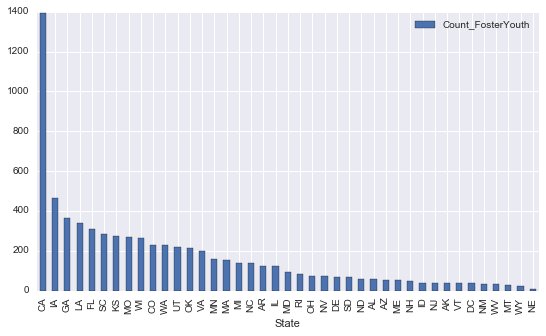

In [20]:
state_density_c1.plot(kind='bar', figsize=(9,5))

In [21]:
# Sample stratified by Demographics

In [22]:
# Gender

In [23]:
gender = demographics.Sex.value_counts()

gender = gender.to_frame()
gender.reset_index(inplace=True)
gender.columns = ['Sex', 'Count_FosterYouth']

gender

# 1 = Male, 2 = Female

,Sex,Count_FosterYouth
0,2,3521
1,1,3421


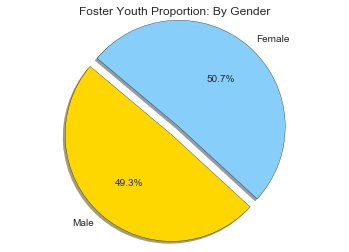

In [24]:
# Data to plot
labels = 'Male', 'Female'

male = gender.at[1,'Count_FosterYouth']
female = gender.at[0,'Count_FosterYouth']

data_count = [male,female]
colors = ['gold', 'lightskyblue']
explode = (0.1, 0)  # explode 1st slice
 
# Plot
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Gender')
plt.show()

----------

In [25]:
# Race

In [26]:
race = demographics.Race.value_counts()

race = race.to_frame()
race.reset_index(inplace=True)
race.columns = ['Race', 'Count_FosterYouth']

race

# White = 1
# Black/African American = 2
# Am Id/AK Native = 3
# Asian = 4
# Pac Islander = 5
# More than 1 Race = 6
# Race Unknown = 99

,Race,Count_FosterYouth
0,1,3705
1,2,2104
2,99,513
3,6,351
4,3,183
5,4,69
6,5,17


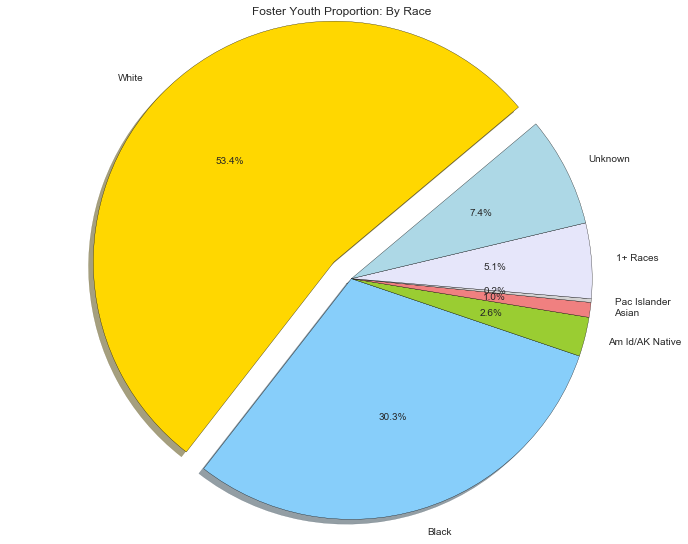

In [27]:
# Data to plot
labels = 'White', 'Black', 'Am Id/AK Native', 'Asian', 'Pac Islander', '1+ Races', 'Unknown'

white = race.at[0,'Count_FosterYouth']
black = race.at[1,'Count_FosterYouth']
native = race.at[4,'Count_FosterYouth']
azn = race.at[5,'Count_FosterYouth']
pac = race.at[6,'Count_FosterYouth']
mult = race.at[3,'Count_FosterYouth']
unk = race.at[2,'Count_FosterYouth']

data_count = [white,black,native,azn,pac,mult,unk]
colors = ['gold', 'lightskyblue', 'yellowgreen', 'lightcoral', 'lightgrey', 'lavender', 'lightblue']
explode = (0.1, 0, 0, 0, 0, 0, 0)  # explode 1st slice
 
# Plot
plt.figure(figsize=(12, 9))
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=40)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Race')

plt.show()

----

In [28]:
# Ethnicity

In [29]:
ethn = demographics.RaceEthn.value_counts()

ethn = ethn.to_frame()
ethn.reset_index(inplace=True)
ethn.columns = ['Ethnicity', 'Count_FosterYouth']

ethn

# Non-Hispanic White = 1
# NH Black/African American = 2
# NH Am Id/AK Native = 3
# NH Asian = 4
# NH Pac Islander = 5
# NH More than 1 Race = 6
# Hispanic = 7
# Race Unknown = 99


,Ethnicity,Count_FosterYouth
0,1,3123
1,2,2037
2,7,1197
3,6,301
4,3,152
5,4,61
6,99,58
7,5,13


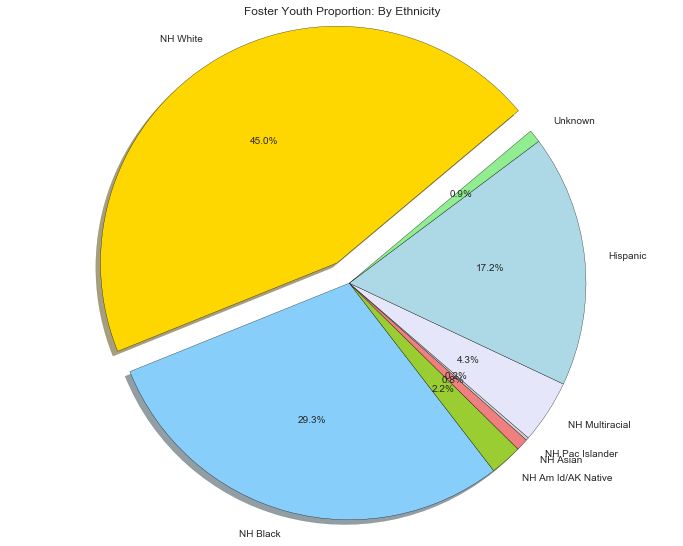

In [30]:
# Data to plot
labels = 'NH White', 'NH Black', 'NH Am Id/AK Native', 'NH Asian', 'NH Pac Islander', 'NH Multiracial',\
'Hispanic','Unknown'

white = ethn.at[0,'Count_FosterYouth']
black = ethn.at[1,'Count_FosterYouth']
native = ethn.at[4,'Count_FosterYouth']
azn = ethn.at[6,'Count_FosterYouth']
pac = ethn.at[7,'Count_FosterYouth']
mult = ethn.at[3,'Count_FosterYouth']
hisp = ethn.at[2, 'Count_FosterYouth']
unk = ethn.at[5,'Count_FosterYouth']

data_count = [white,black,native,azn,pac,mult,hisp,unk]
colors = ['gold', 'lightskyblue', 'yellowgreen', 'lightcoral', 'lightgrey', 'lavender', 'lightblue','lightgreen']
explode = (0.1, 0, 0, 0, 0, 0, 0, 0)  # explode 1st slice
 
# Plot
plt.figure(figsize=(12, 9))
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=40)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Ethnicity')

plt.show()


----

In [31]:
# Education Level

In [32]:
edu = demographics.EdLevlSv.value_counts()

edu = edu.to_frame()
edu.reset_index(inplace=True)
edu.columns = ['Education_Lvl', 'Count_FosterYouth']

edu

# 0 = Less than 6th grade
# 6 = 6th grade
# 7 = 7th grade
# 8 = 8th grade
# 9 = 9th grade
# 10 = 10th grade
# 11 = 11th grade
# 12 = 12th grade
# 13 = Post secondary
# 14 = College
# 77 = Blank


,Education_Lvl,Count_FosterYouth
0,10,2397
1,11,1938
2,9,1478
3,8,513
4,12,332
5,7,100
6,0,63
7,6,45
8,13,43
9,14,33


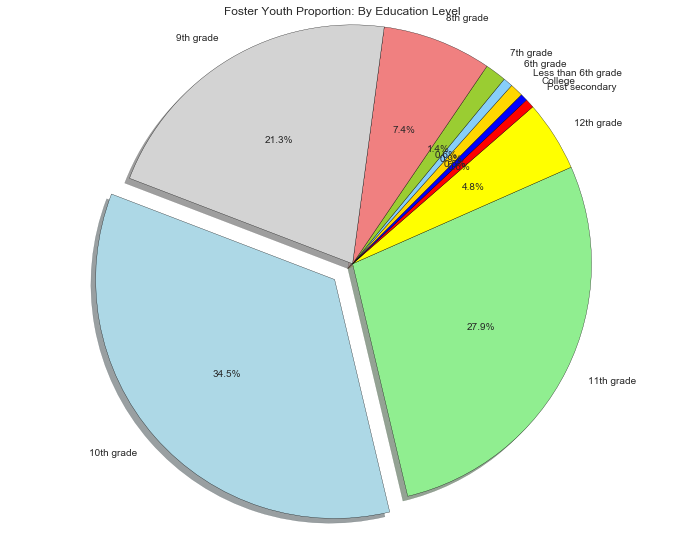

In [33]:
# Data to plot
labels = 'Less than 6th grade', '6th grade', '7th grade', '8th grade', '9th grade', '10th grade',\
'11th grade','12th grade', 'Post secondary', 'College'

less_6 = edu.at[6,'Count_FosterYouth']
six = edu.at[7,'Count_FosterYouth']
seven = edu.at[5,'Count_FosterYouth']
eight = edu.at[3,'Count_FosterYouth']
nine = edu.at[2,'Count_FosterYouth']
ten = edu.at[0,'Count_FosterYouth']
eleven = edu.at[1,'Count_FosterYouth']
twelve = edu.at[4,'Count_FosterYouth']
post = edu.at[8,'Count_FosterYouth']
college = edu.at[9,'Count_FosterYouth']
# blank = edu.at[4,'Count_FosterYouth']

data_count = [less_6,six,seven,eight,nine,ten,eleven,twelve,post,college]
colors = ['gold', 'lightskyblue', 'yellowgreen', 'lightcoral', 'lightgrey', 'lightblue','lightgreen',\
          'yellow', 'red', 'blue']
explode = (0, 0, 0, 0, 0, 0.1, 0, 0, 0, 0)  # explode 1st slice
 
# Plot
plt.figure(figsize=(12, 9))
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=45)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Education Level')

plt.show()


----

In [34]:
# Delinquincy Status

In [35]:
delin = demographics.DelinqntSv.value_counts()

delin = delin.to_frame()
delin.reset_index(inplace=True)
delin.columns = ['DelinqntSv', 'Count_FosterYouth']

delin

# 0 = No
# 1 = Yes
# 77 = Blank


,DelinqntSv,Count_FosterYouth
0,0,5606
1,1,1336


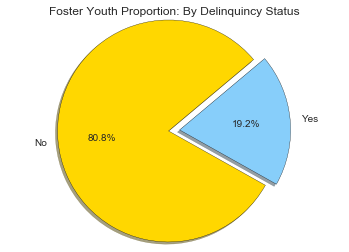

In [36]:
# Data to plot
labels = 'No', 'Yes'

no = delin.at[0,'Count_FosterYouth']
yes = delin.at[1,'Count_FosterYouth']

data_count = [no,yes]
colors = ['gold', 'lightskyblue']
explode = (0.1, 0)  # explode 1st slice
 
# Plot
plt.figure(figsize=(6, 4))
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=40)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Delinquincy Status')

plt.show()


----

In [37]:
# Tribe Status

In [38]:
tribe = demographics.TribeSv.value_counts()

tribe = tribe.to_frame()
tribe.reset_index(inplace=True)
tribe.columns = ['TribeSv', 'Count_FosterYouth']

tribe

# 0 = No
# 1 = Yes
# 77 = Blank


,TribeSv,Count_FosterYouth
0,0,6715
1,1,227


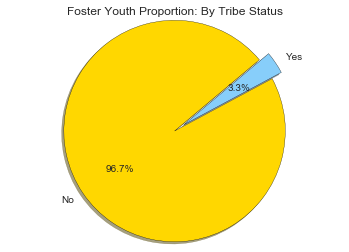

In [39]:
# Data to plot
labels = 'No', 'Yes'

no = tribe.at[0,'Count_FosterYouth']
yes = tribe.at[1,'Count_FosterYouth']
# blank = tribe.at[1,'Count_FosterYouth']

data_count = [no,yes]
colors = ['gold', 'lightskyblue']
explode = (0.1, 0)  # explode 1st slice
 
# Plot
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=40)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Tribe Status')

plt.show()


----

In [40]:
# Special Ed Status

In [41]:
sped = demographics.SpecEdSv.value_counts()

sped = sped.to_frame()
sped.reset_index(inplace=True)
sped.columns = ['SpecEdSv', 'Count_FosterYouth']

sped

# 0 = No
# 1 = Yes
# 77 = Blank


,SpecEdSv,Count_FosterYouth
0,0,5098
1,1,1844


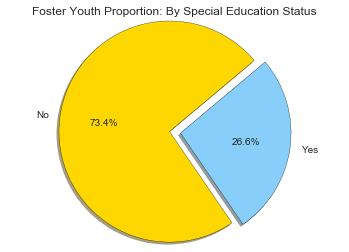

In [42]:
 # Data to plot
labels = 'No', 'Yes'

no = sped.at[0,'Count_FosterYouth']
yes = sped.at[1,'Count_FosterYouth']

data_count = [no,yes]
colors = ['gold', 'lightskyblue']
explode = (0.1, 0)  # explode 1st slice
 
# Plot
plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=40)
 
plt.axis('equal')
plt.title('Foster Youth Proportion: By Special Education Status')

plt.show()


_________________________________________________________________________________________________________
_________________________________________________________________________________________________________

## Services (aka: inputs; features)

In [43]:
features.columns

Index([u'ILNAsv', u'AcSuppSv', u'PSEdSuppSv', u'CareerSv', u'EmplyTrSv',
       u'BudgetSv', u'HousEdSv', u'HlthEdSv', u'FamSuppSv', u'MentorSv',
       u'SILsv', u'RmBrdFASv', u'EducFinaSv', u'OthrFinaSv', u'Num_services'],
      dtype='object')

In [44]:
# Create functions for repeating code

def create_val_cnt_table(series_of_interest):
    
    
    val_cnt_table = series_of_interest.value_counts()
    val_cnt_table = val_cnt_table.to_frame()
    val_cnt_table.reset_index(inplace=True)
    val_cnt_table.columns = ['Service_Status', 'Count_FosterYouth']

    return val_cnt_table

#####

def plot_pie(no,yes,title):
    # Data to plot
    labels = 'No', 'Yes'
    data_count = [no,yes]
    colors = ['gold', 'lightskyblue']
    explode = (0.1, 0)  # explode 1st slice
 
    # Plot
    plt.pie(data_count, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
 
    plt.axis('equal')
    plt.title(title)

    return plt.show()
    

In [45]:
# Independent Needs Assessment

ilna = create_val_cnt_table(features['ILNAsv'])
ilna

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,1,3905
1,0,3037


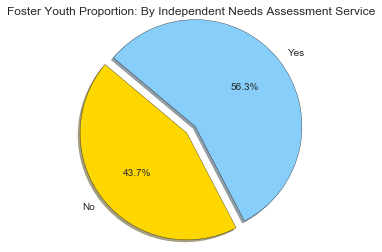

In [46]:
no = ilna.at[1,'Count_FosterYouth']
yes = ilna.at[0,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Independent Needs Assessment Service'

plot_pie(no,yes,title)


----

In [47]:
# Academic Support Service

AcSuppSv = create_val_cnt_table(features['AcSuppSv'])
AcSuppSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,1,3738
1,0,3204


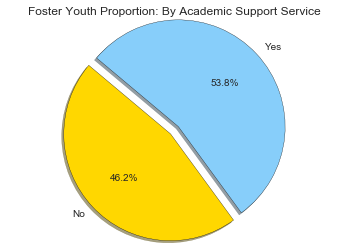

In [48]:
no = AcSuppSv.at[1,'Count_FosterYouth']
yes = AcSuppSv.at[0,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Academic Support Service'

plot_pie(no,yes,title)

__________________________________________________________________________________________________________________


In [49]:
# Post-Secondary Support Service

PSEdSuppSv = create_val_cnt_table(features['PSEdSuppSv'])
PSEdSuppSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,5518
1,1,1424


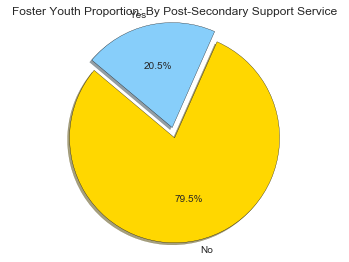

In [50]:
no = PSEdSuppSv.at[0,'Count_FosterYouth']
yes = PSEdSuppSv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Post-Secondary Support Service'

plot_pie(no,yes,title)

__________________________________________________________________________________________________________________


In [51]:

# Career Service

CareerSv = create_val_cnt_table(features['CareerSv'])
CareerSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,3934
1,1,3008


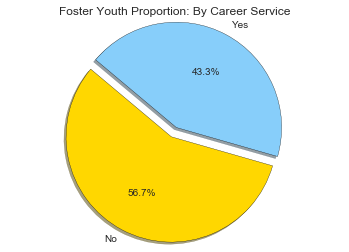

In [52]:
no = CareerSv.at[0,'Count_FosterYouth']
yes = CareerSv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Career Service'

plot_pie(no,yes,title)

----

In [53]:
# Employee Training Service

EmplyTrSv = create_val_cnt_table(features['EmplyTrSv'])
EmplyTrSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,5076
1,1,1866


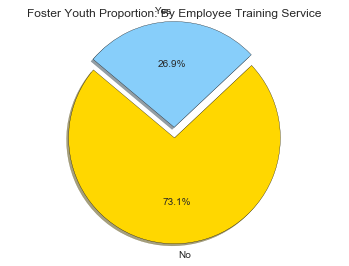

In [54]:
no = EmplyTrSv.at[0,'Count_FosterYouth']
yes = EmplyTrSv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Employee Training Service'

plot_pie(no,yes,title)

----

In [55]:
# Budget Service

BudgetSv = create_val_cnt_table(features['BudgetSv'])
BudgetSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,4270
1,1,2672


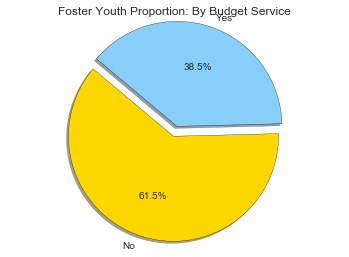

In [56]:
no = BudgetSv.at[0,'Count_FosterYouth']
yes = BudgetSv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Budget Service'

plot_pie(no,yes,title)

----

In [57]:
# Housing Education Service

HousEdSv = create_val_cnt_table(features['HousEdSv'])
HousEdSv

# 0 = No
# 1 = Yes
# 77 = Blank


,Service_Status,Count_FosterYouth
0,0,4217
1,1,2725


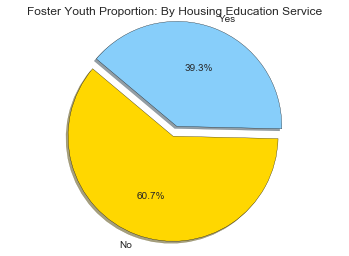

In [58]:
no = HousEdSv.at[0,'Count_FosterYouth']
yes = HousEdSv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Housing Education Service'

plot_pie(no,yes,title)

----

In [59]:
# Health Education Service

HlthEdSv = create_val_cnt_table(features['HlthEdSv'])
HlthEdSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,4096
1,1,2846


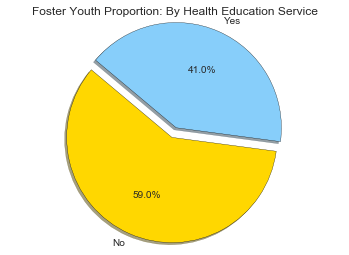

In [60]:
no = HlthEdSv.at[0,'Count_FosterYouth']
yes = HlthEdSv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Health Education Service'

plot_pie(no,yes,title)

----

In [61]:
# Family Support Service

FamSuppSv = create_val_cnt_table(features['FamSuppSv'])
FamSuppSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,4635
1,1,2307


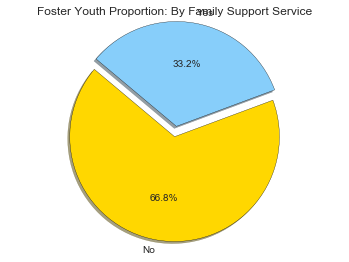

In [62]:
no = FamSuppSv.at[0,'Count_FosterYouth']
yes = FamSuppSv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Family Support Service'

plot_pie(no,yes,title)

----

In [63]:
# Mentoring Service

MentorSv = create_val_cnt_table(features['MentorSv'])
MentorSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,5385
1,1,1557


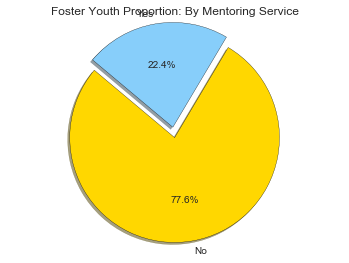

In [64]:
no = MentorSv.at[0,'Count_FosterYouth']
yes = MentorSv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Mentoring Service'

plot_pie(no,yes,title)

----

In [65]:
# Supervised Independent Living Service

SILsv = create_val_cnt_table(features['SILsv'])
SILsv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,6427
1,1,515


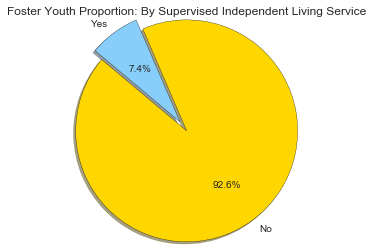

In [66]:
no = SILsv.at[0,'Count_FosterYouth']
yes = SILsv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Supervised Independent Living Service'

plot_pie(no,yes,title)

----

In [67]:
# Room and Board FinAid Service

RmBrdFASv = create_val_cnt_table(features['RmBrdFASv'])
RmBrdFASv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,6353
1,1,589


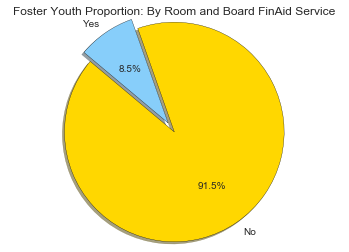

In [68]:
no = RmBrdFASv.at[0,'Count_FosterYouth']
yes = RmBrdFASv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Room and Board FinAid Service'

plot_pie(no,yes,title)

----

In [69]:
# Education Finance Service

EducFinaSv = create_val_cnt_table(features['EducFinaSv'])
EducFinaSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,6040
1,1,902


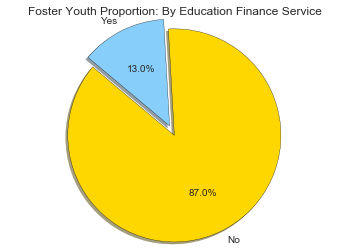

In [70]:
no = EducFinaSv.at[0,'Count_FosterYouth']
yes = EducFinaSv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Education Finance Service'

plot_pie(no,yes,title)

----

In [71]:
# Other Finance Service

OthrFinaSv = create_val_cnt_table(features['OthrFinaSv'])
OthrFinaSv

# 0 = No
# 1 = Yes
# 77 = Blank

,Service_Status,Count_FosterYouth
0,0,5540
1,1,1402


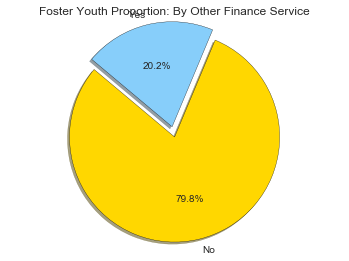

In [72]:
no = OthrFinaSv.at[0,'Count_FosterYouth']
yes = OthrFinaSv.at[1,'Count_FosterYouth']
title = 'Foster Youth Proportion: By Other Finance Service'

plot_pie(no,yes,title)

----

In [73]:
# Number of Services Distribution

Num_services = create_val_cnt_table(features['Num_services'])
Num_services = Num_services.sort_values(by='Service_Status')
Num_services.columns = ['Num_services', 'Count_FosterYouth']

Num_services

,Num_services,Count_FosterYouth
14,0,6
0,1,1516
1,2,1070
2,3,897
3,4,728
4,5,656
5,6,523
6,7,421
7,8,400
8,9,254


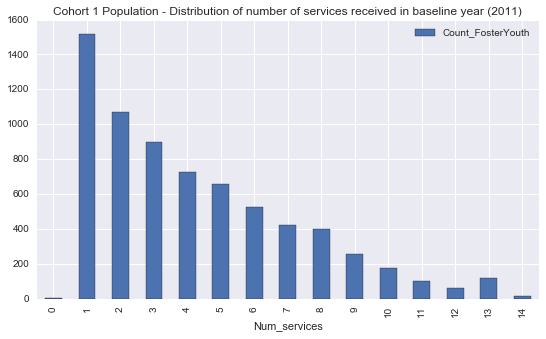

In [74]:
Num_services.plot(kind='bar',x='Num_services',y='Count_FosterYouth', title='Cohort 1 Population - Distribution of number of services received in baseline year (2011)', figsize=(9,5))

In [75]:
# From histogram above, normal distribution of number of services can be assumed...

_________________________________________________________________________________________________________
_________________________________________________________________________________________________________


## Outcomes (aka: outputs; targets)

In [76]:
targets.columns

Index([u'PubFoodAs', u'PubHousAs', u'OthrFinAs', u'HighEdCert', u'CurrFTE',
       u'CurrPTE', u'PubFinAs', u'CurrenRoll', u'PrescripIn', u'Homeless',
       u'SubAbuse', u'Incarc', u'Medicaid', u'CnctAdult', u'EmplySklls',
       u'OthrHlthIn', u'MedicalIn', u'MentlHlthIn'],
      dtype='object')

In [77]:
# Create functions for repeating code

def create_val_cnt_table(series_of_interest):
    
    val_cnt_table = series_of_interest.value_counts()
    val_cnt_table = val_cnt_table.to_frame()
    val_cnt_table.reset_index(inplace=True)
    val_cnt_table.columns = ['Outcomes_Status', 'Count_FosterYouth']

    return val_cnt_table

####

def plot_bar(table_i, title=None):

    bar_plot = table_i.plot(kind='bar',x='Outcomes_Status',y='Count_FosterYouth', figsize=(9,5), title=title)
    
    return bar_plot

In [78]:
# Public Food Assistance

PubFoodAs = create_val_cnt_table(targets['PubFoodAs'])
PubFoodAs

,Outcomes_Status,Count_FosterYouth
0,Blank,2627
1,No,1861
2,Not Applicable (in Foster Care),1470
3,Yes,921
4,Declined,63


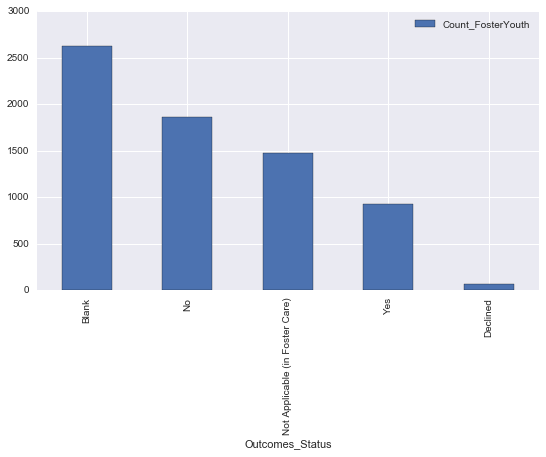

In [79]:
plot_bar(PubFoodAs)

----

In [80]:
# Public Housing Assistance

PubHousAs = create_val_cnt_table(targets['PubHousAs'])
PubHousAs

,Outcomes_Status,Count_FosterYouth
0,Blank,2625
1,No,2585
2,Not Applicable (in Foster Care),1469
3,Yes,197
4,Declined,66


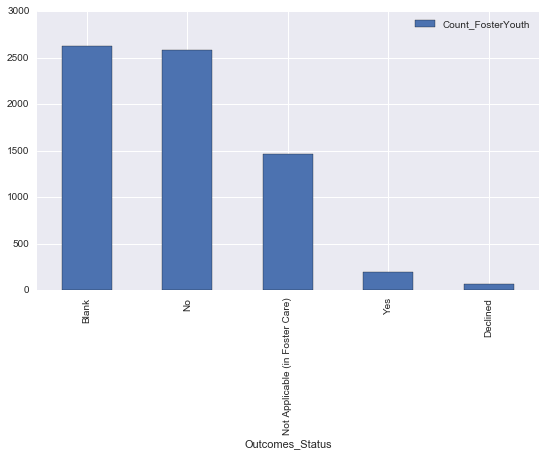

In [81]:
plot_bar(PubHousAs)

----

In [82]:
# Other Financial Assistance

OthrFinAs = create_val_cnt_table(targets['OthrFinAs'])
OthrFinAs

,Outcomes_Status,Count_FosterYouth
0,No,3542
1,Blank,2632
2,Yes,656
3,Declined,112


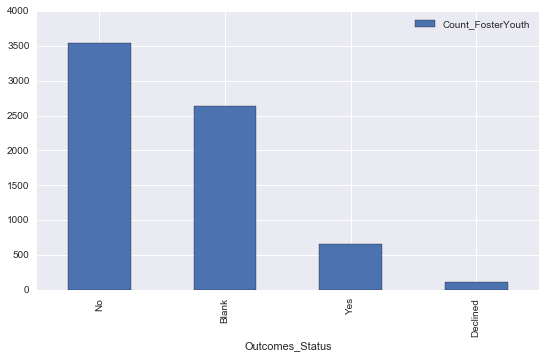

In [83]:
plot_bar(OthrFinAs)

----

In [84]:
# Higher Education Certification

HighEdCert = create_val_cnt_table(targets['HighEdCert'])
HighEdCert

,Outcomes_Status,Count_FosterYouth
0,Blank,2636
1,High school diploma/GED,2392
2,None of the above,1618
3,Declined,89
4,Vocational certificate,60
5,Vocational license,16
6,Associate's Degree,7
7,Higher degree,7
8,Bachelor's Degree,2


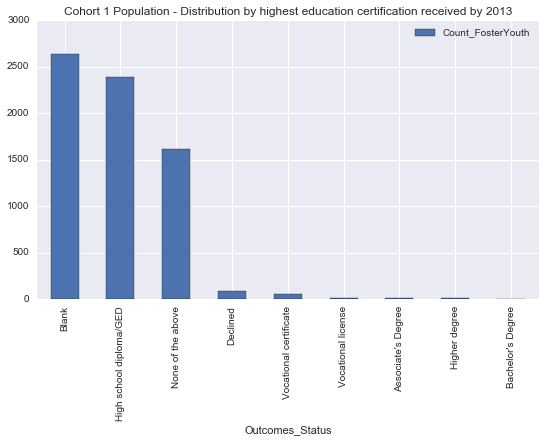

In [85]:
plot_bar(HighEdCert, 'Cohort 1 Population - Distribution by highest education certification received by 2013')

----

In [86]:
# Current Full Time Employment

CurrFTE = create_val_cnt_table(targets['CurrFTE'])
CurrFTE

,Outcomes_Status,Count_FosterYouth
0,No,3741
1,Blank,2633
2,"Yes, employed full time",513
3,Declined,55


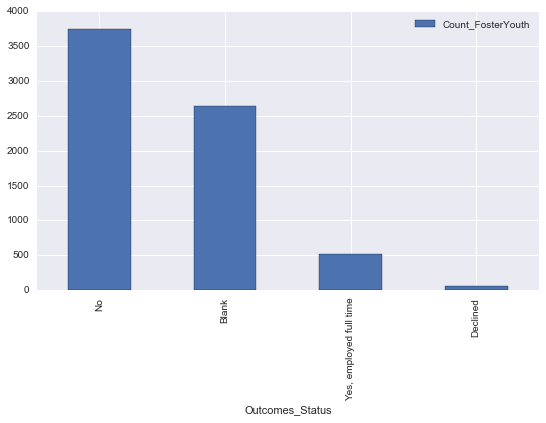

In [87]:
plot_bar(CurrFTE)

----

In [88]:
# Current Part-Time Employment

CurrPTE = create_val_cnt_table(targets['CurrPTE'])
CurrPTE

,Outcomes_Status,Count_FosterYouth
0,No,3159
1,Blank,2635
2,"Yes, employed part time",1063
3,Declined,85


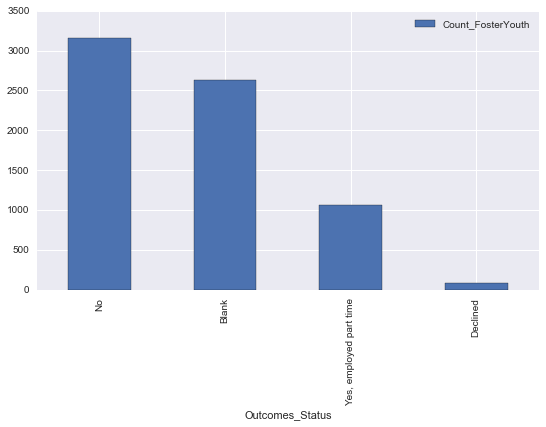

In [89]:
plot_bar(CurrPTE)

----

In [90]:
# Public Financial Assistance

PubFinAs = create_val_cnt_table(targets['PubFinAs'])
PubFinAs

,Outcomes_Status,Count_FosterYouth
0,Blank,2631
1,No,2447
2,Not Applicable (in Foster Care),1466
3,Yes,323
4,Declined,75


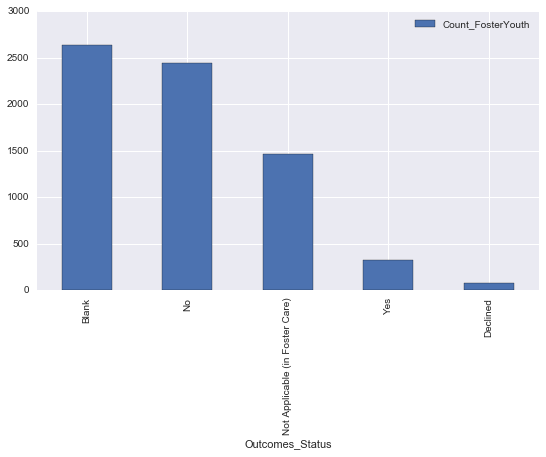

In [91]:
plot_bar(PubFinAs)

----

In [92]:
# Currently Enrolled in Higher Education

CurrenRoll = create_val_cnt_table(targets['CurrenRoll'])
CurrenRoll

,Outcomes_Status,Count_FosterYouth
0,Blank,2631
1,Yes,2329
2,No,1907
3,Declined,75


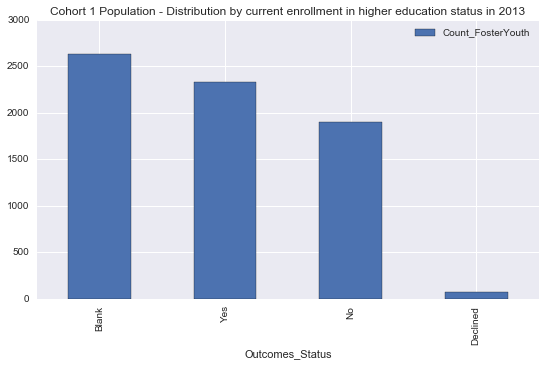

In [93]:
plot_bar(CurrenRoll, 'Cohort 1 Population - Distribution by current enrollment in higher education status in 2013')

----

In [94]:
# Rx Insurance

PrescripIn = create_val_cnt_table(targets['PrescripIn'])
PrescripIn


,Outcomes_Status,Count_FosterYouth
0,Not Applicable,3773
1,Blank,2630
2,Yes,444
3,Don't Know,42
4,No,29
5,Declined,24


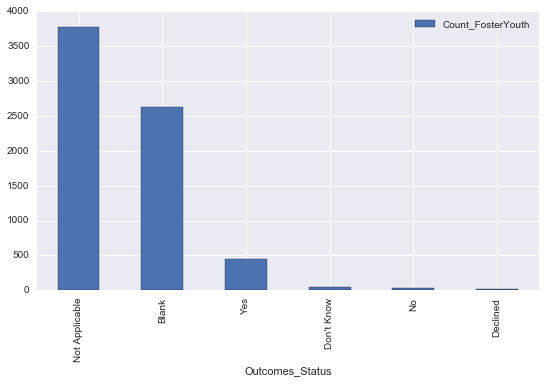

In [95]:
plot_bar(PrescripIn)

----

In [96]:
# Experienced Homelessness

Homeless = create_val_cnt_table(targets['Homeless'])
Homeless

,Outcomes_Status,Count_FosterYouth
0,No,3362
1,Blank,2633
2,Yes,851
3,Declined,96


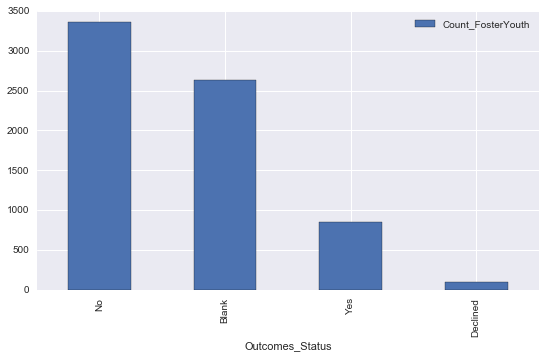

In [97]:
plot_bar(Homeless)

----

In [98]:
# Substance Abuse 

SubAbuse = create_val_cnt_table(targets['SubAbuse'])
SubAbuse

,Outcomes_Status,Count_FosterYouth
0,No,3657
1,Blank,2632
2,Yes,579
3,Declined,74


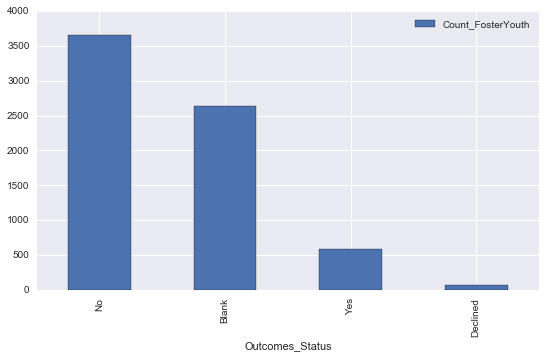

In [99]:
plot_bar(SubAbuse)

----

In [100]:
# Incarceration

Incarc = create_val_cnt_table(targets['Incarc'])
Incarc

,Outcomes_Status,Count_FosterYouth
0,No,3377
1,Blank,2634
2,Yes,849
3,Declined,82


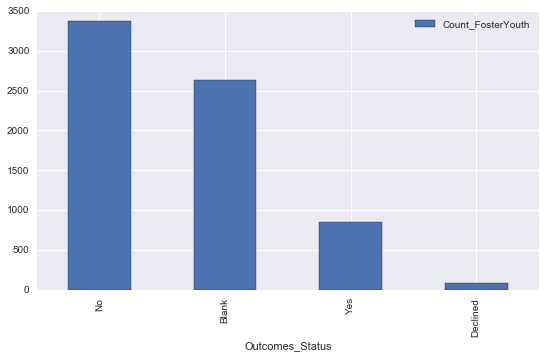

In [101]:
plot_bar(Incarc)

In [102]:
# MDCD

Medicaid = create_val_cnt_table(targets['Medicaid'])
Medicaid

,Outcomes_Status,Count_FosterYouth
0,Yes,3211
1,Blank,2632
2,No,799
3,Do Not Know,221
4,Declined,79


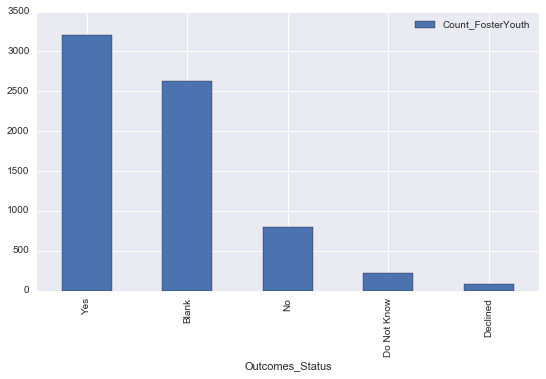

In [103]:
plot_bar(Medicaid)

----

In [104]:
# Connection to Adult

CnctAdult = create_val_cnt_table(targets['CnctAdult'])
CnctAdult

,Outcomes_Status,Count_FosterYouth
0,Yes,3917
1,Blank,2632
2,No,321
3,Declined,72


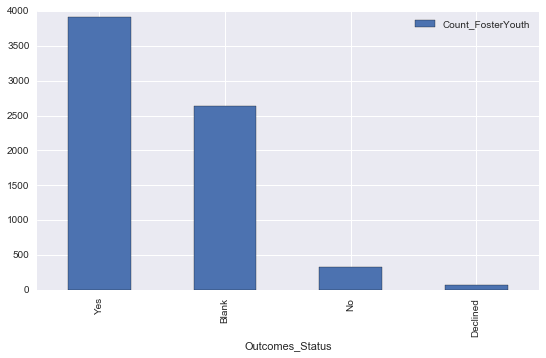

In [105]:
plot_bar(CnctAdult)

----

In [106]:
# Employee Skills Gained

EmplySklls = create_val_cnt_table(targets['EmplySklls'])
EmplySklls

,Outcomes_Status,Count_FosterYouth
0,No,2866
1,Blank,2631
2,Yes,1358
3,Declined,87


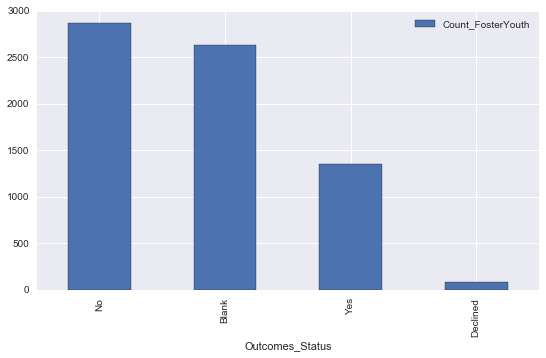

In [107]:
plot_bar(EmplySklls)

----

In [108]:
# Other Health Insurance

OthrHlthIn = create_val_cnt_table(targets['OthrHlthIn'])
OthrHlthIn['Outcomes_Status'] = OthrHlthIn['Outcomes_Status'].map({'78.0': 'Solely MDCD','No':'No',\
                                                                   'Yes':'Yes','Blank':'Blank',\
                                                                   'Do Not Know':'Do Not Know','Declined':'Declined'})
OthrHlthIn

,Outcomes_Status,Count_FosterYouth
0,No,3315
1,Blank,2633
2,Yes,587
3,Do Not Know,305
4,Declined,93
5,Solely MDCD,9


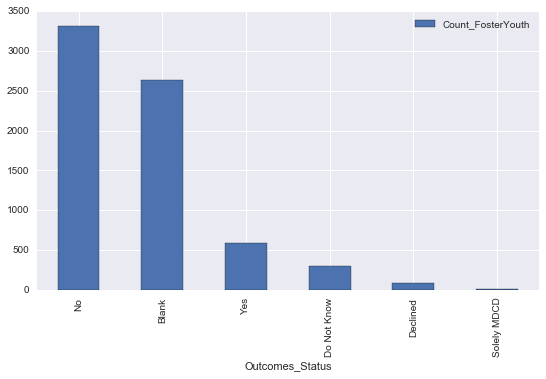

In [109]:
plot_bar(OthrHlthIn)

----

In [110]:
# Medical Insurance

MedicalIn = create_val_cnt_table(targets['MedicalIn'])
MedicalIn

,Outcomes_Status,Count_FosterYouth
0,Not Applicable,3705
1,Blank,2630
2,Yes,507
3,Don't Know,49
4,No,38
5,Declined,13


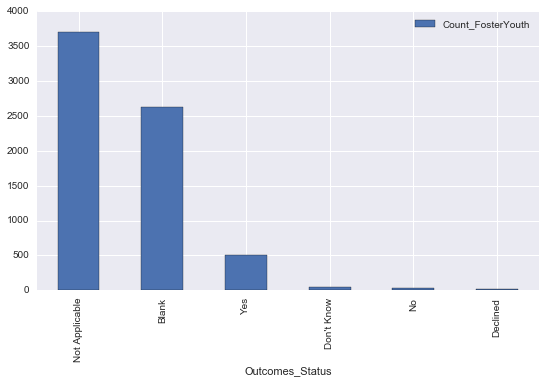

In [111]:
plot_bar(MedicalIn)

----

In [112]:
# Mental Health Insurance

MentlHlthIn = create_val_cnt_table(targets['MentlHlthIn'])
MentlHlthIn

,Outcomes_Status,Count_FosterYouth
0,Not Applicable,3773
1,Blank,2631
2,Yes,387
3,Don't Know,81
4,No,46
5,Declined,24


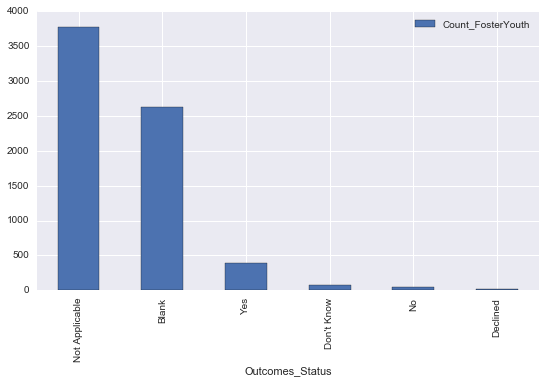

In [113]:
plot_bar(MentlHlthIn)

----

Might want to drop this target variable (MentlHlthIn) since majority are blank/not applicable.

----

# 3) BIVARIATE ANALYSIS

### LOOKING AT RELATIONSHIPS BETWEEN VARIABLES

##### Demographics by Features

In [24]:
# First creating a class to automate the Chi Squared Test of Association for my analysis. 

class test_of_ass:
    
    def __init__(self, var1, var2):
        self.var1 = var1
        self.var2 = var2
    
    def crosstab(self):
        
        cross_tab = pd.crosstab(self.var1, self.var2)
        return cross_tab
    
    def chi2_tool(self):
        
        chi2_tool = chi2_contingency(self.crosstab())
        stats = ['chi2_float', 'p_value', 'dof', 'ExpFreq_array']

        dict_result = dict(zip(stats, chi2_tool))
        return dict_result
            
        
    def print_results(self):
        
        results_dict = self.chi2_tool()
        p_val = results_dict['p_value']
                
        if p_val > 0.01:
            print "P-value is greater than significance level. Therefore, the null hypothesis can NOT be rejected."
        else:
            print "P-value is less than significance level. Therefore, the null hypothesis CAN be rejected."
            
        return "p-value: " + str(p_val)
        
        
        
#         'Degrees of Freedom: {}'.format()
#         if 
        
#         'The computed value of the test statistic is {}.'.format()
        
        
        
#         alt_hypothesis = 'HA: Distributions of {} DO differ based on {} of foster youth.'.format(self.var2, self.var1)
#         return dof
#         return chi2_stat
        
#  is 5.347

# Step 5. Reject H0, the computed test statistic is too high. 


In [25]:
# test_1 = test_of_ass(demographics['Sex'], features_sub['ILNAsv'])

# print test_1.crosstab()
# print test_1.chi2_tool()
# print test_1.print_results()

In [28]:
def hypoStatements(var1, var2):
        
    null_hypothesis = 'H0: Distributions of {} DO NOT differ based on {} of foster youth.'.format(var2, var1)
    alt_hypothesis = 'HA: Distributions of {} DO differ based on {} of foster youth.'.format(var2, var1)
    sig_lvl = 'Significance Level = 0.01'
    
    statements = [null_hypothesis, alt_hypothesis, sig_lvl]
    
    for info in statements:
        print info

# features_sub is defined in the next cell. This text snippet should come after the next cell. 
# However, I placed it here temporarily for convenience.
           
for demos in demographics:
    for servs in features_sub:

        test_1 = test_of_ass(demographics[demos], features_sub[servs])
        
        hypoStatements(demos,servs)
        print
        print test_1.print_results()
        print
        print ('----------')

H0: Distributions of ILNAsv DO NOT differ based on St of foster youth.
HA: Distributions of ILNAsv DO differ based on St of foster youth.
Significance Level = 0.01

P-value is less than significance level. Therefore, the null hypothesis CAN be rejected.
p-value: 8.26761703656e-267

----------
H0: Distributions of AcSuppSv DO NOT differ based on St of foster youth.
HA: Distributions of AcSuppSv DO differ based on St of foster youth.
Significance Level = 0.01

P-value is less than significance level. Therefore, the null hypothesis CAN be rejected.
p-value: 2.74416025166e-213

----------
H0: Distributions of PSEdSuppSv DO NOT differ based on St of foster youth.
HA: Distributions of PSEdSuppSv DO differ based on St of foster youth.
Significance Level = 0.01

P-value is less than significance level. Therefore, the null hypothesis CAN be rejected.
p-value: 4.8085775741e-159

----------
H0: Distributions of CareerSv DO NOT differ based on St of foster youth.
HA: Distributions of CareerSv DO d

/Users/cguy/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


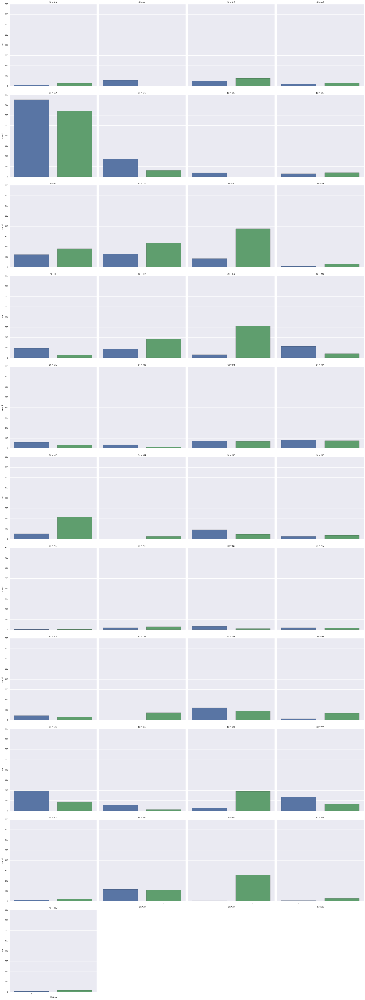

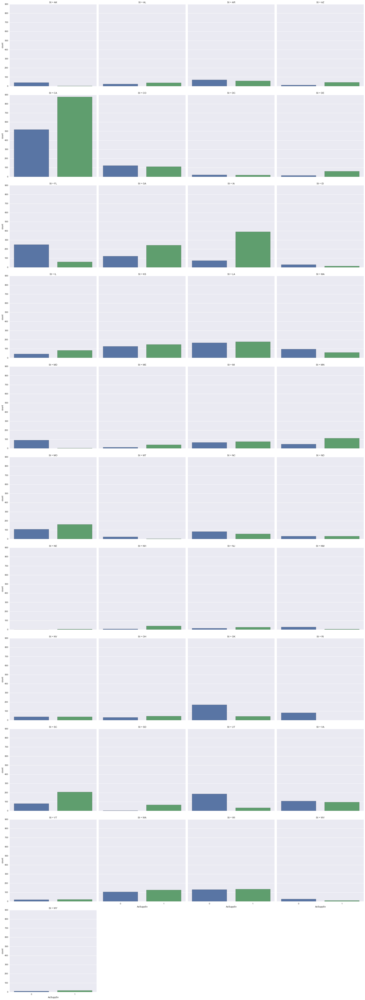

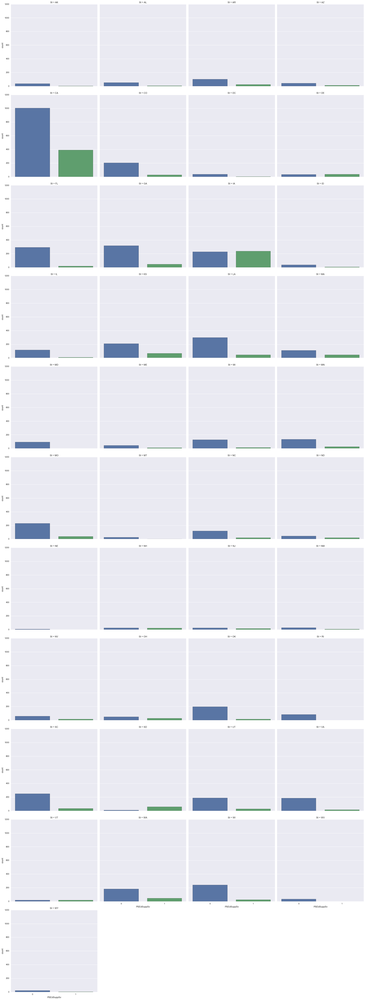

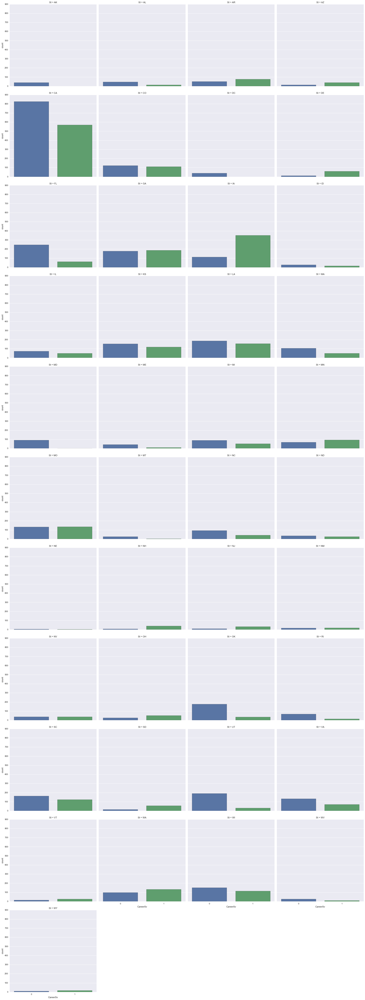

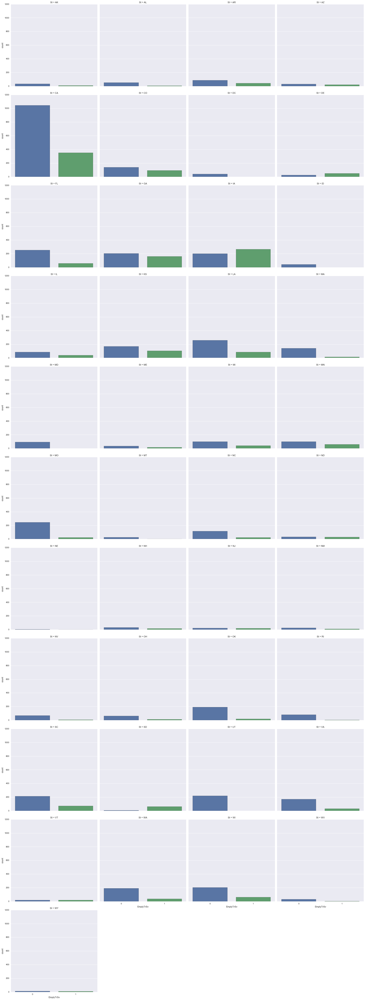

...

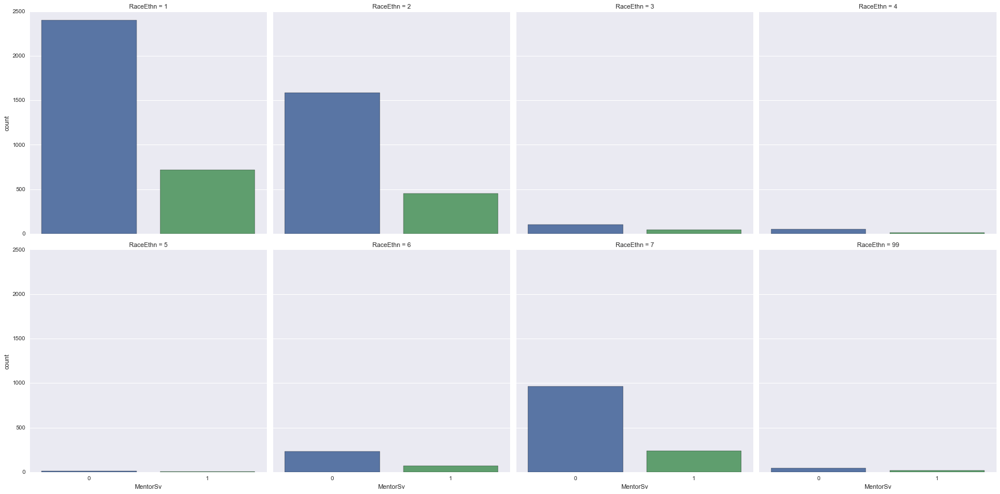

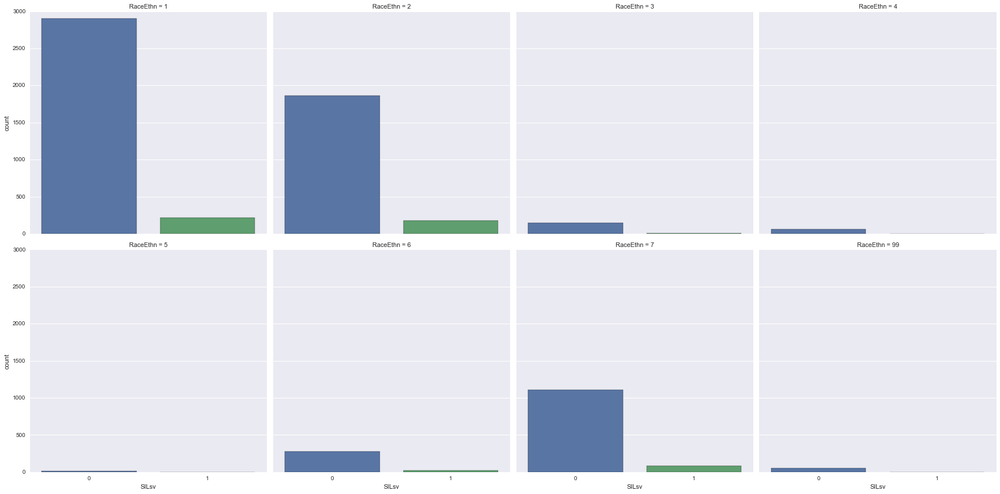

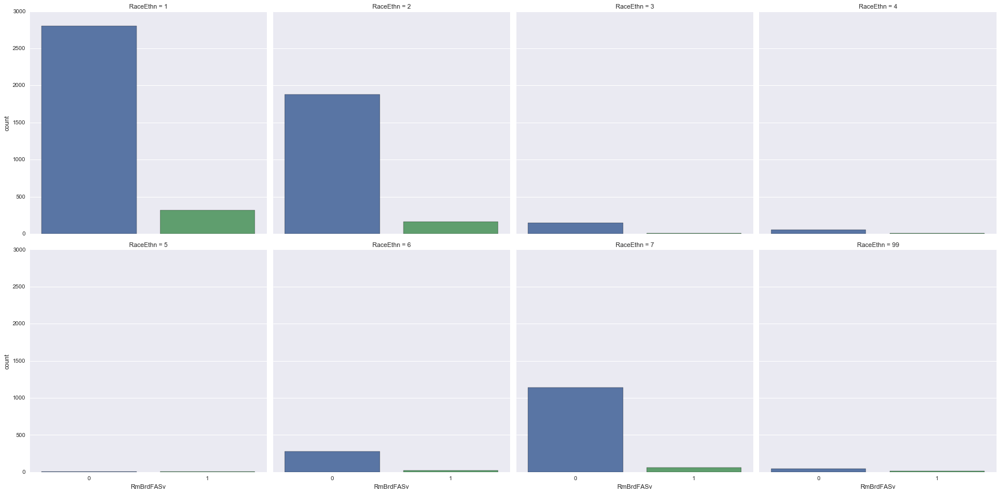

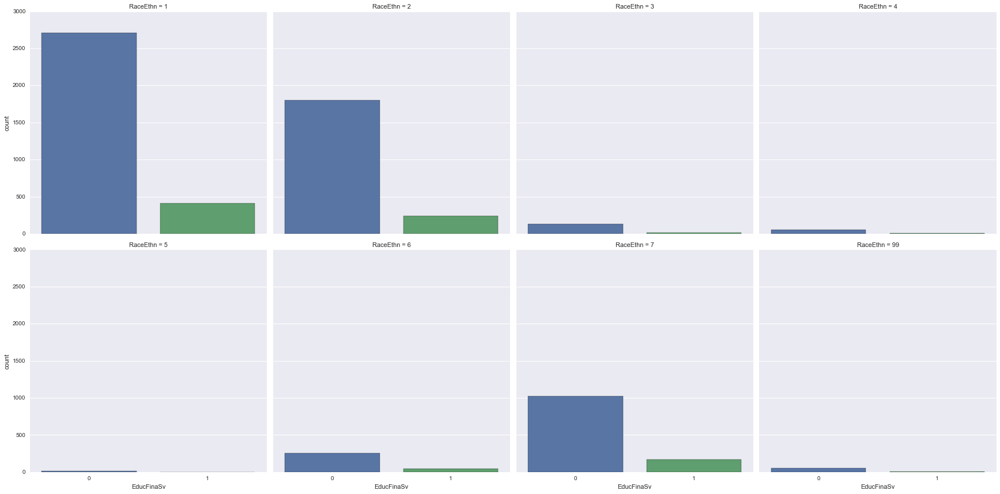

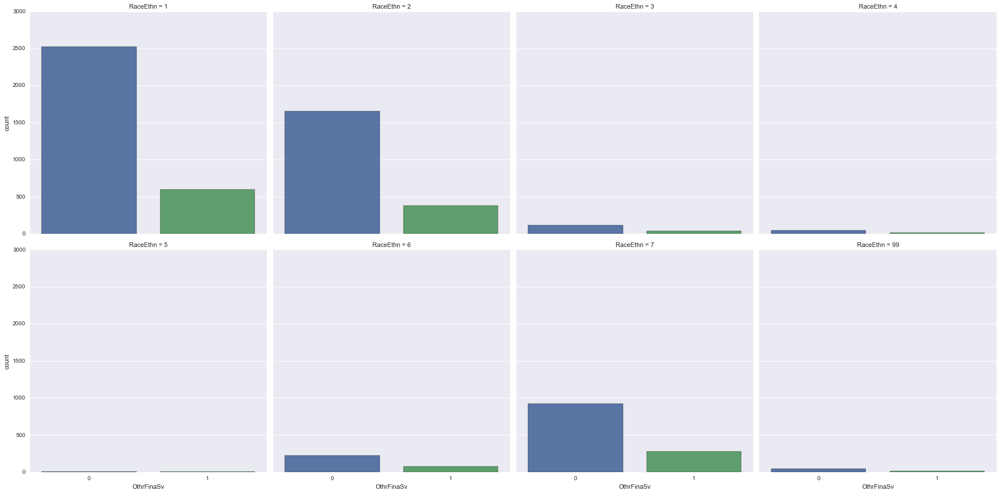

In [27]:
features_sub = features.drop('Num_services',axis=1)

for column in demographics:
    for services in features_sub:
        sns.factorplot(services, col=column, col_wrap=4, data=cohort_1, kind="count", size=6, aspect=1)

In [121]:
# Number of Services by demographics

# # Create column for number of services received in demo table

def add_tally(row):
    return 1    

services_count = features.T

demo_sub = demographics.copy()
demo_sub['Num_services'] = (services_count == 1).sum()

# Functions for plots of num_services by demo

def set_piv_tab(col):
    demo_i = demo_sub[[col,'Num_services']]
    demo_i['Freq_count'] = demo_i[col].apply(add_tally)
    piv_tab = demo_i.pivot_table(index=['Num_services',col], values='Freq_count', aggfunc=np.sum)
    piv_tab = piv_tab.reset_index()
    
    return piv_tab

def create_ns_plot(col, pivot_table):
    sns.pairplot(pivot_table, hue=col, kind='scatter', diag_kind='hist', size=10)

In [122]:
set_piv_tab('EdLevlSv')

/Users/cguy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,Num_services,EdLevlSv,Freq_count
0,0,9,1
1,0,10,4
2,0,11,1
3,2,0,29
4,2,6,20
5,2,7,46
6,2,8,210
7,2,9,557
8,2,10,905
9,2,11,678


/Users/cguy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


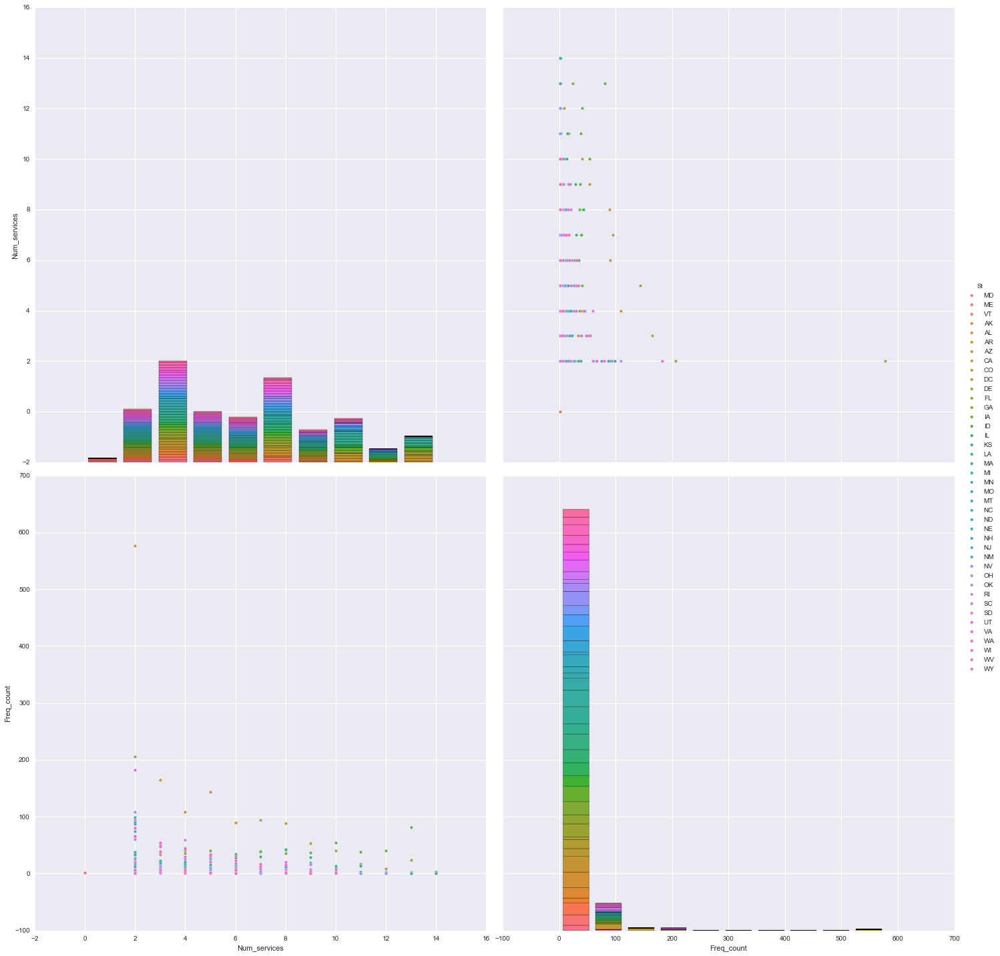

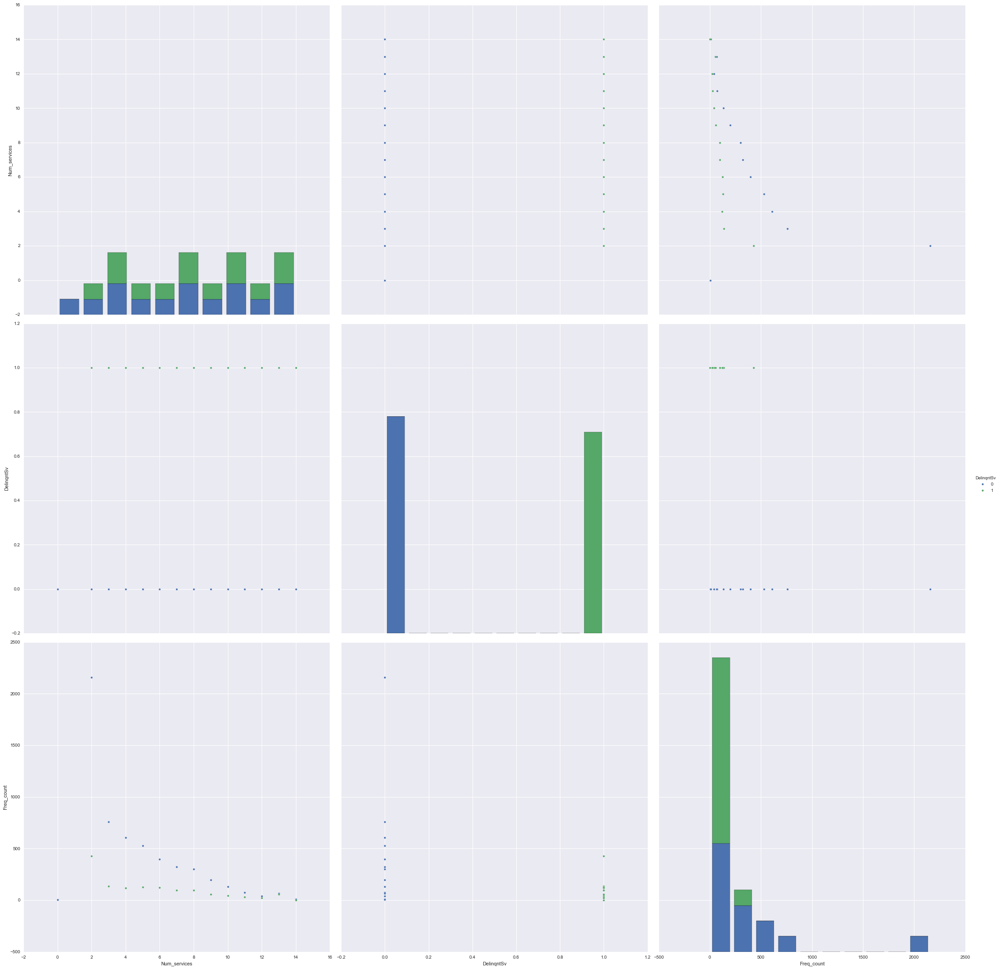

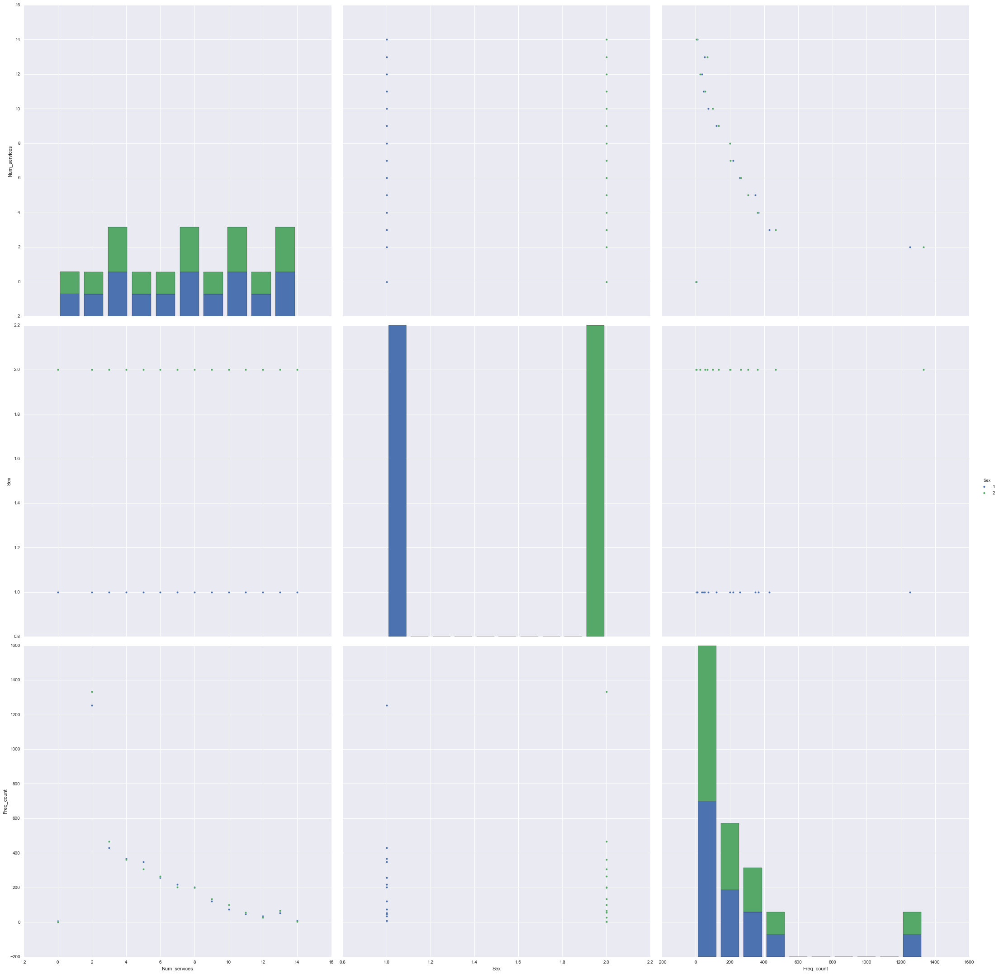

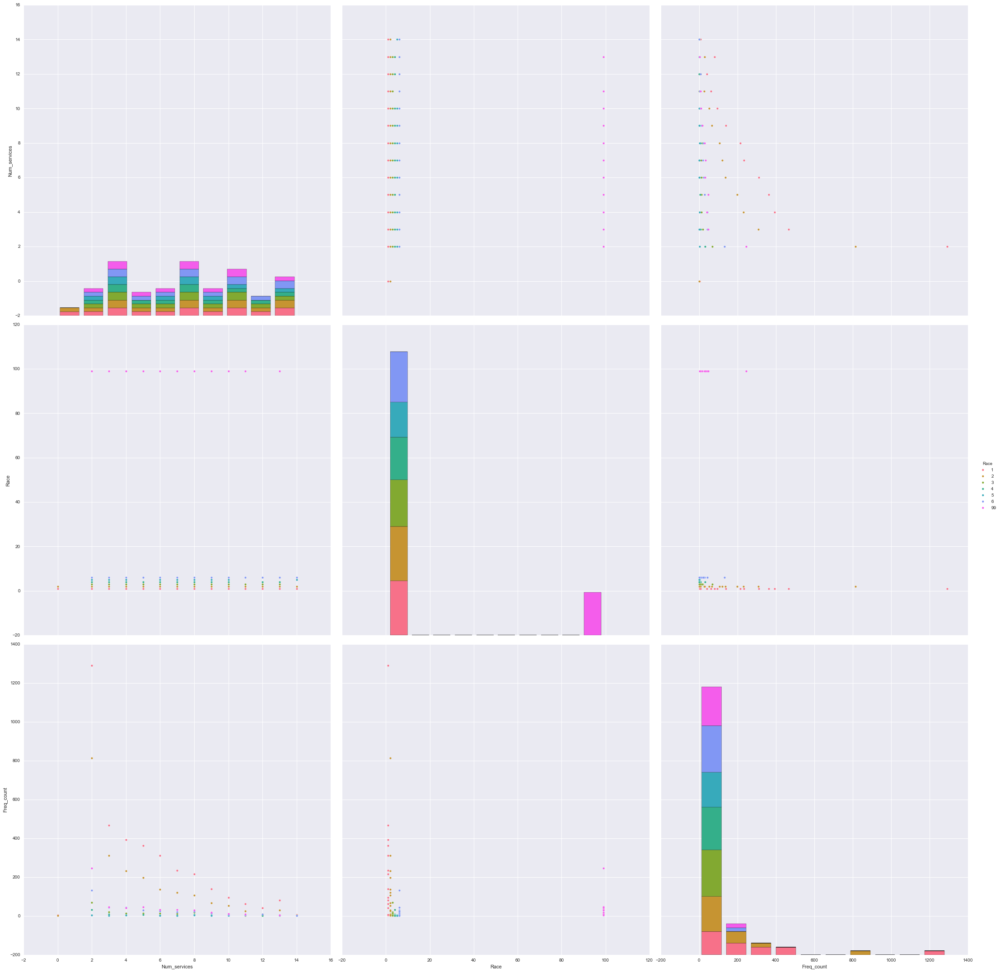

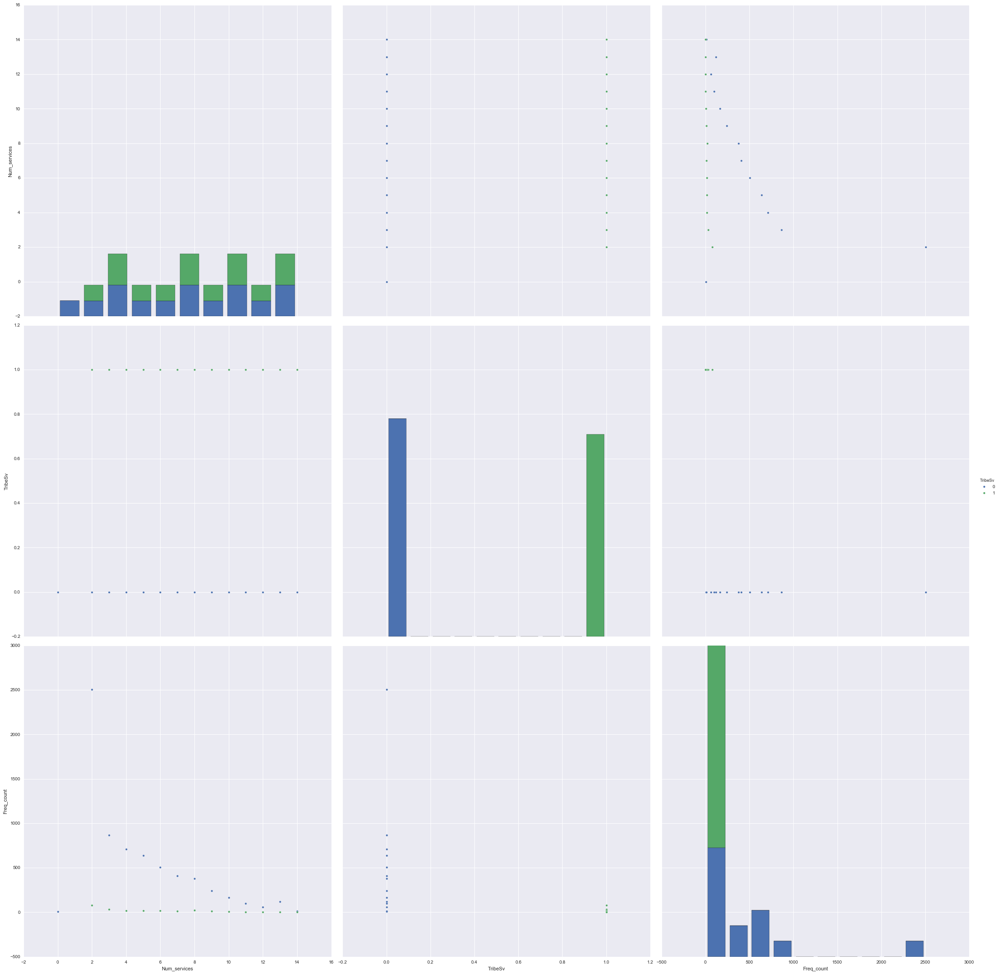

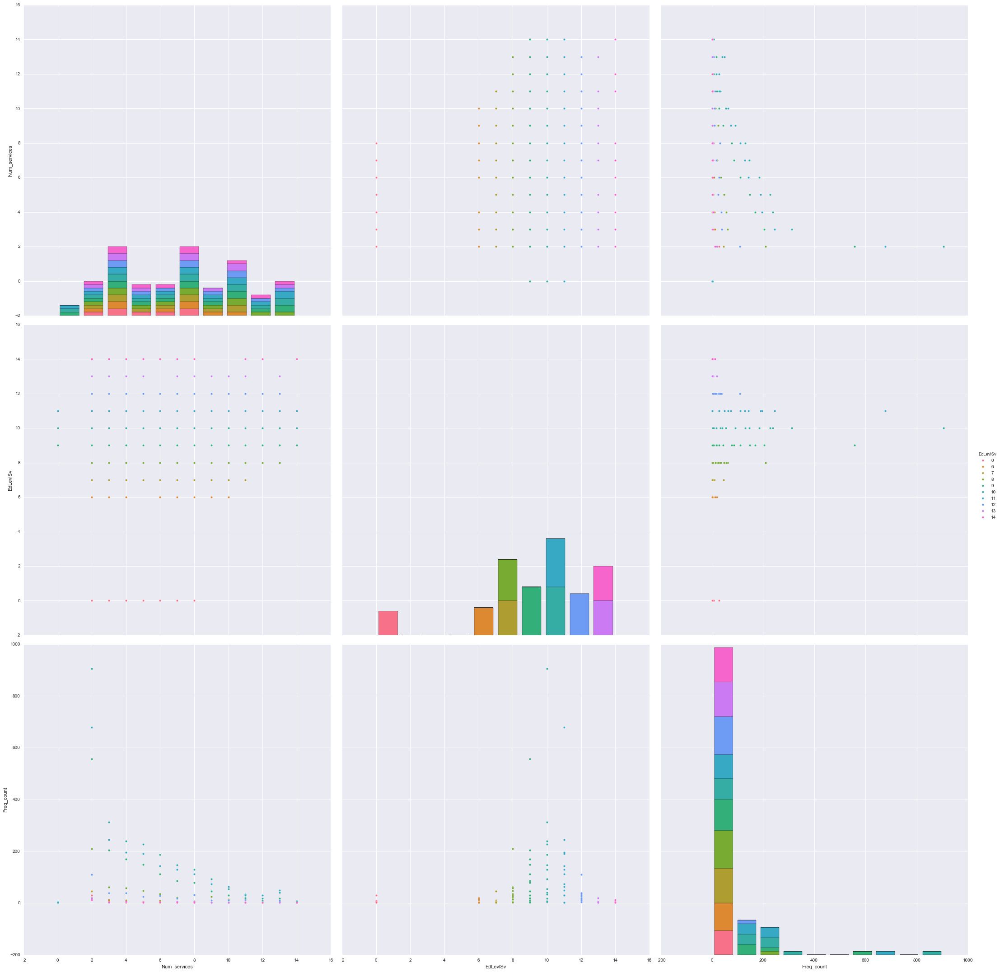

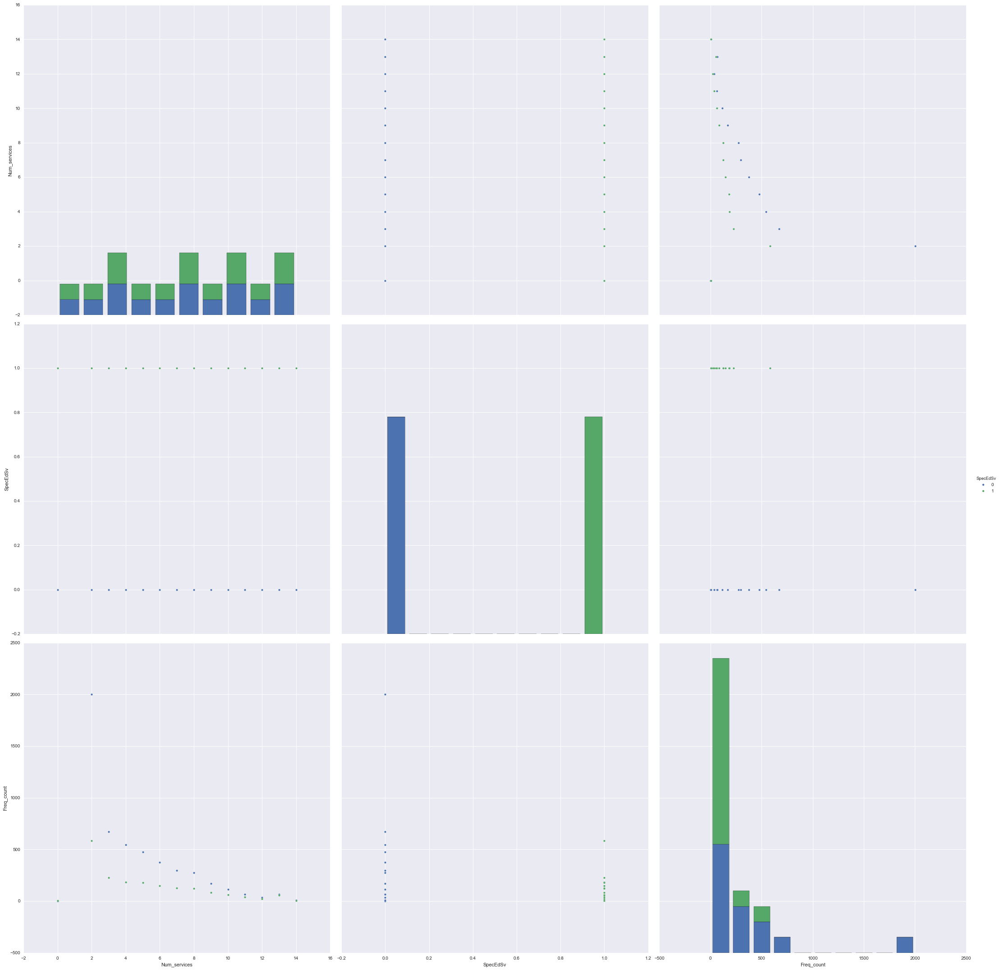

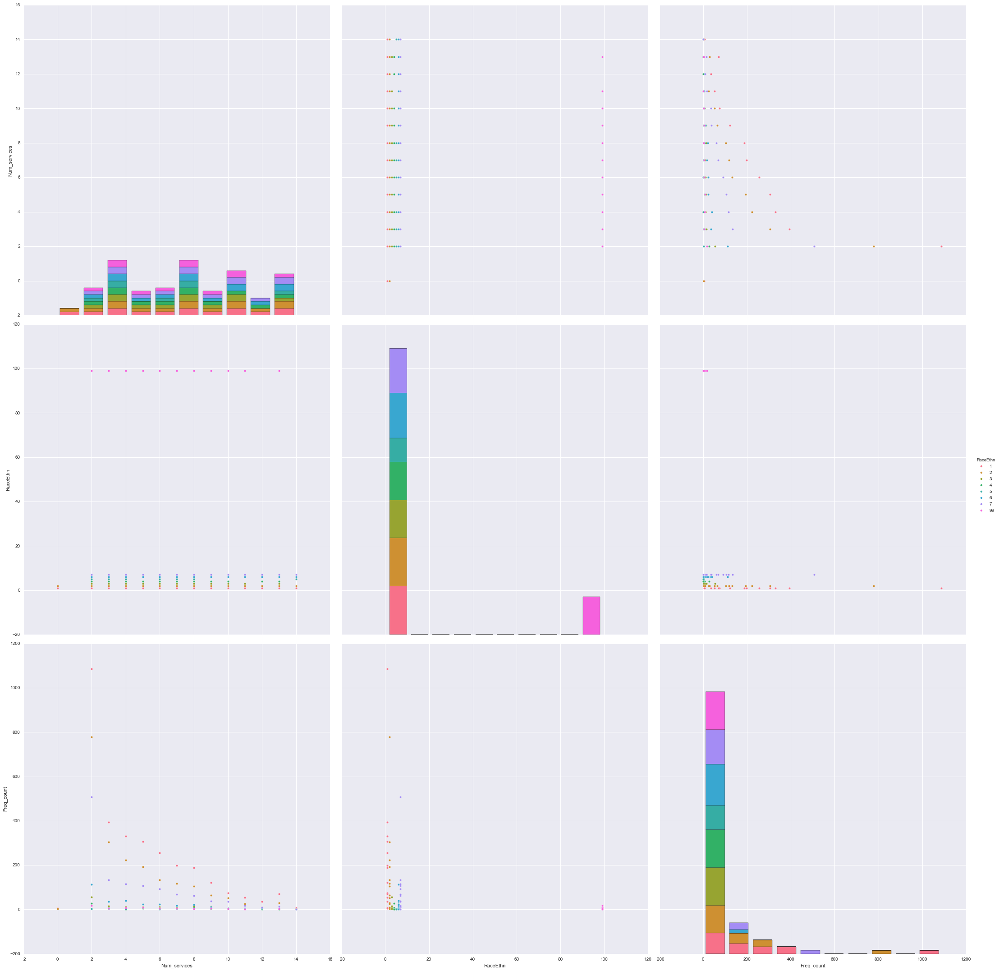

In [123]:
for col in demographics:
    create_ns_plot(col, set_piv_tab(col))


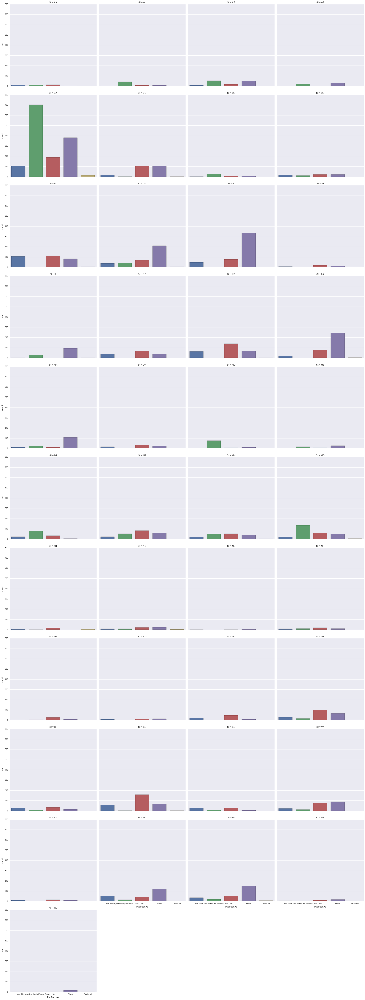

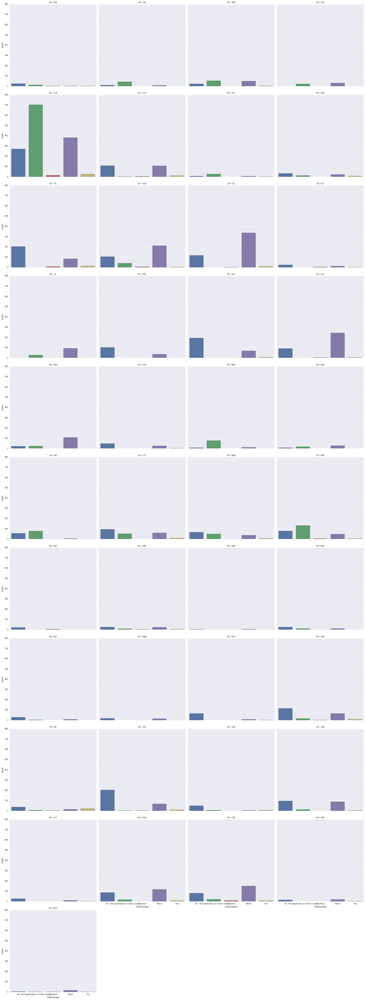

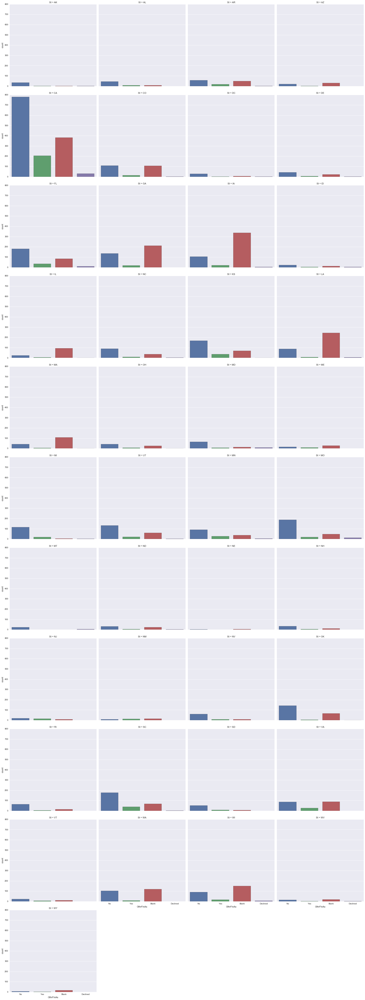

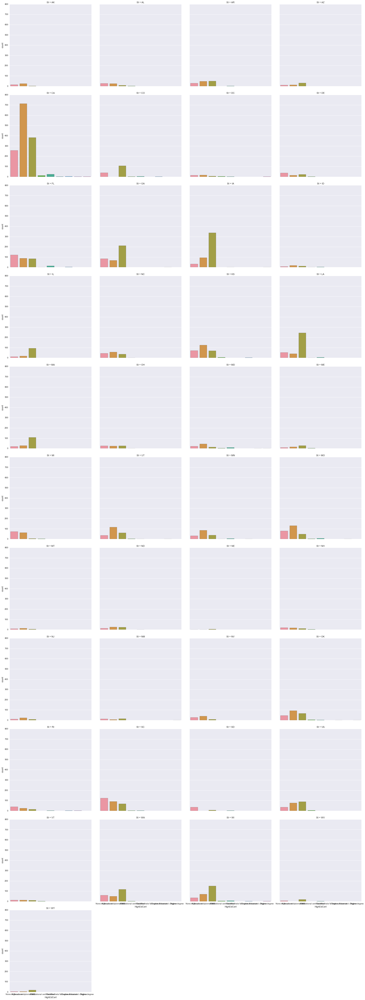

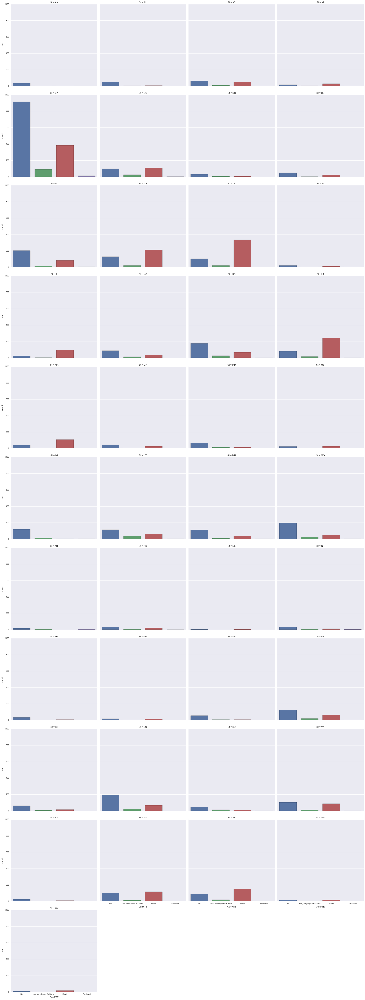

...

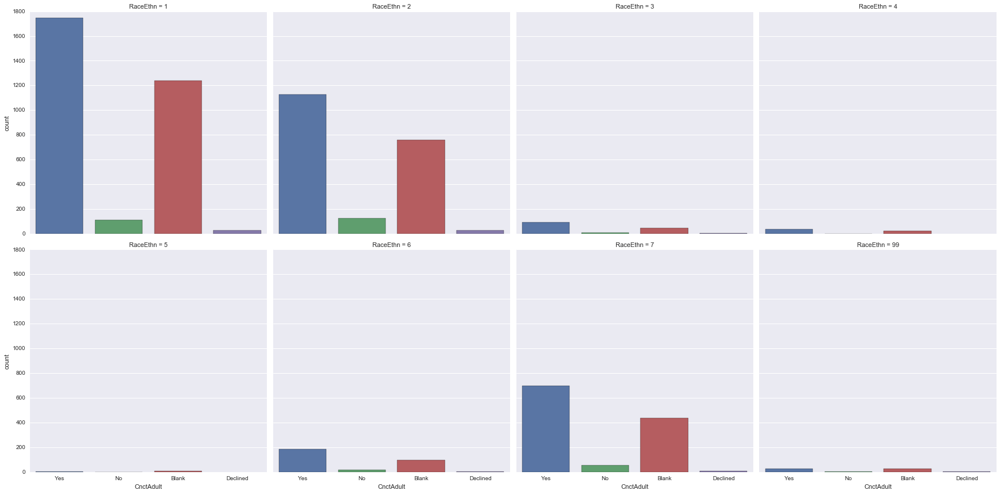

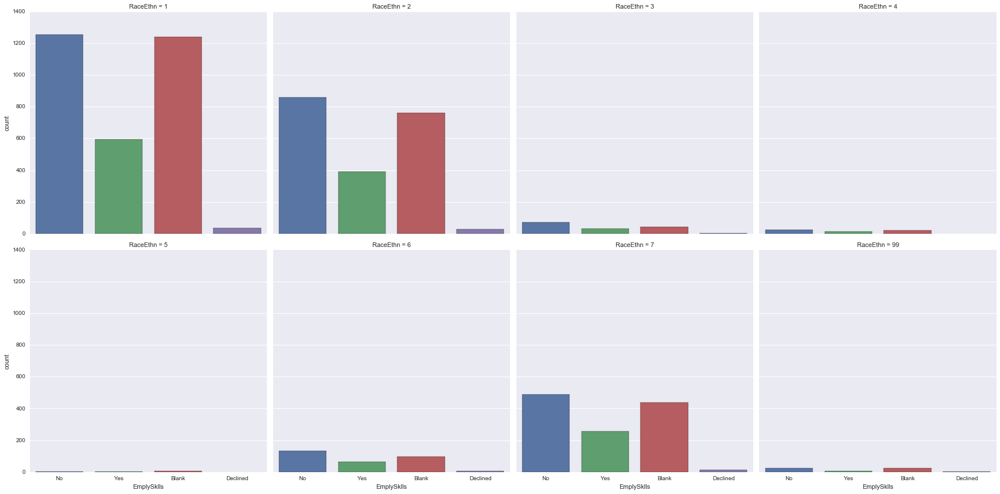

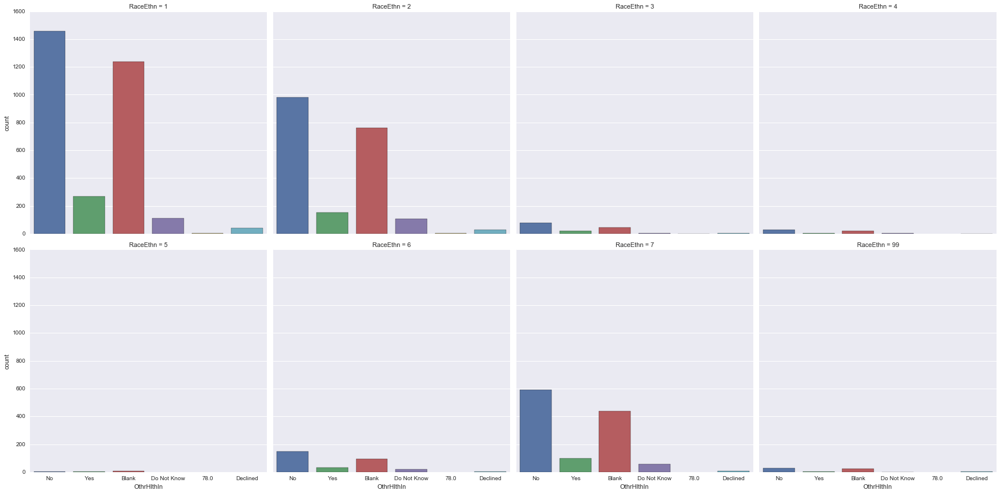

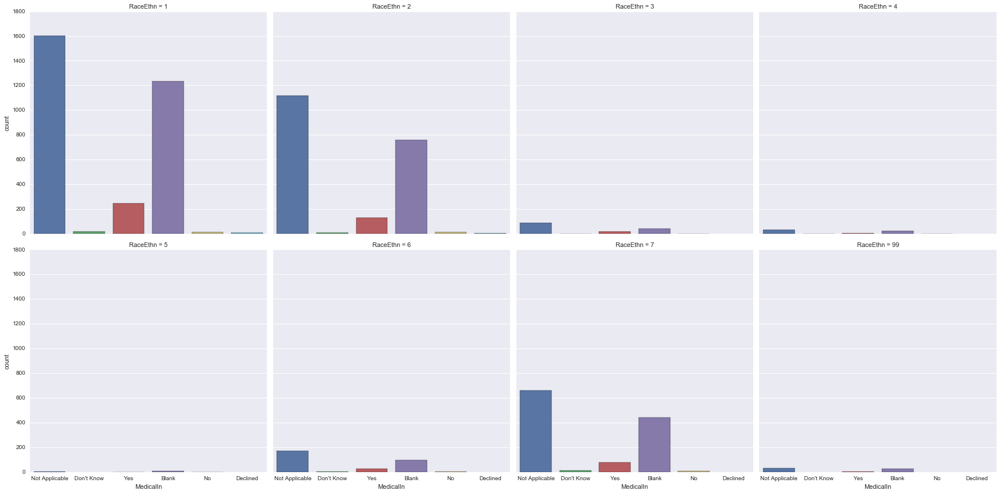

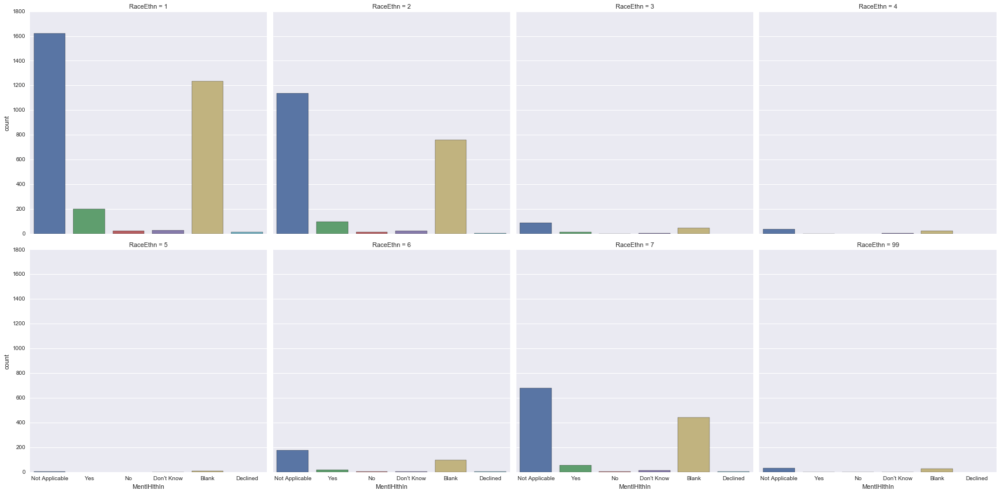

In [124]:
# Demographics by Targets

for column in demographics:
    for outcomes in targets:
        sns.factorplot(outcomes, col=column, col_wrap=4, data=cohort_1, kind="count", size=6, aspect=1)

In [133]:
for demos in demographics:
    for outcomes in targets:

        test_2 = test_of_ass(demographics[demos], targets[outcomes])
        
        hypoStatements(demos,outcomes)
        print
        print test_2.print_results()
        print
        print ('----------')

H0: Distributions of PubFoodAs DO NOT differ based on St of foster youth.
HA: Distributions of PubFoodAs DO differ based on St of foster youth.
Significance Level = 0.01

P-value is less than significance level. Therefore, the null hypothesis CAN be rejected.
p-value: 0.0

----------
H0: Distributions of PubHousAs DO NOT differ based on St of foster youth.
HA: Distributions of PubHousAs DO differ based on St of foster youth.
Significance Level = 0.01

P-value is less than significance level. Therefore, the null hypothesis CAN be rejected.
p-value: 0.0

----------
H0: Distributions of OthrFinAs DO NOT differ based on St of foster youth.
HA: Distributions of OthrFinAs DO differ based on St of foster youth.
Significance Level = 0.01

P-value is less than significance level. Therefore, the null hypothesis CAN be rejected.
p-value: 8.11596269549e-230

----------
H0: Distributions of HighEdCert DO NOT differ based on St of foster youth.
HA: Distributions of HighEdCert DO differ based on St o

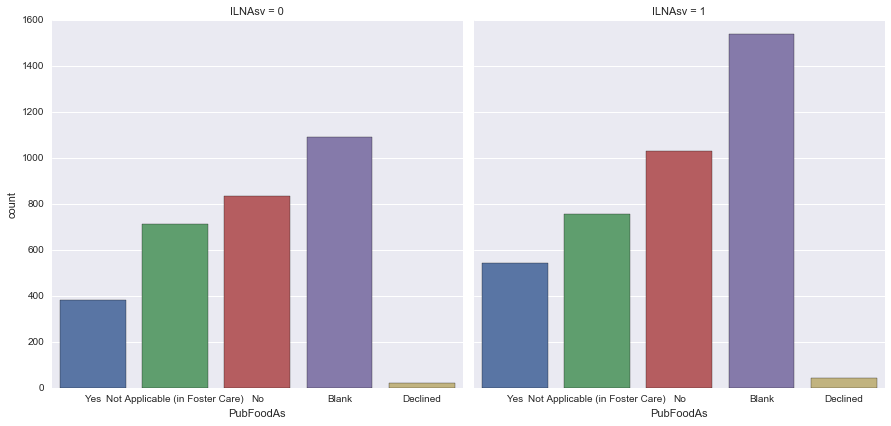

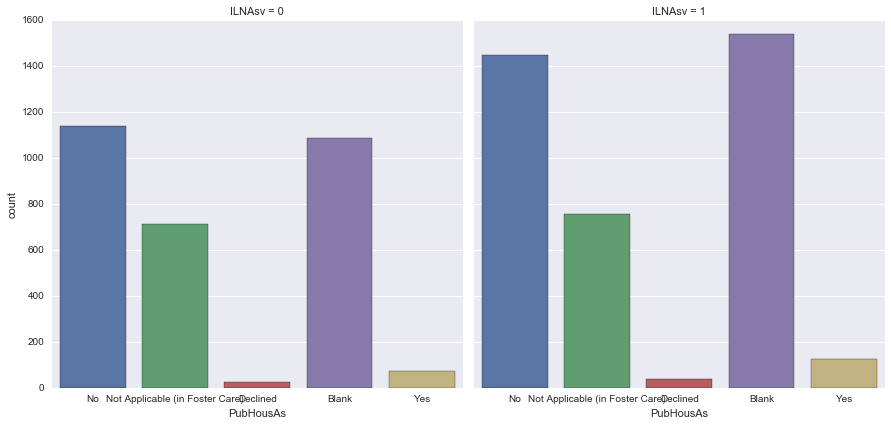

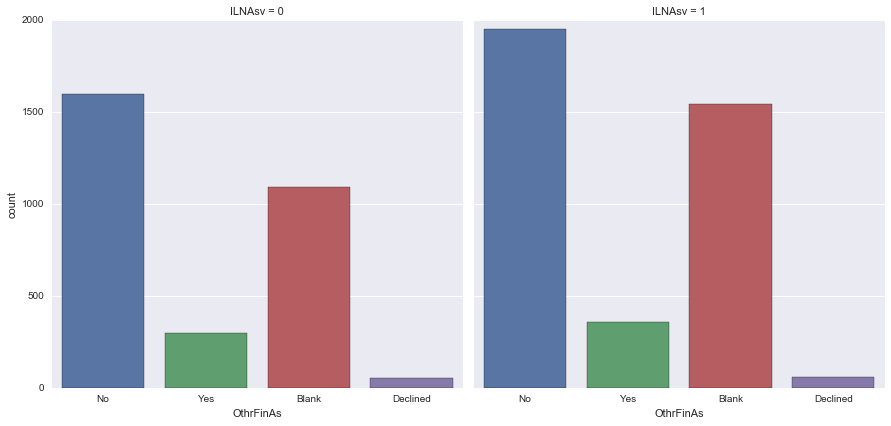

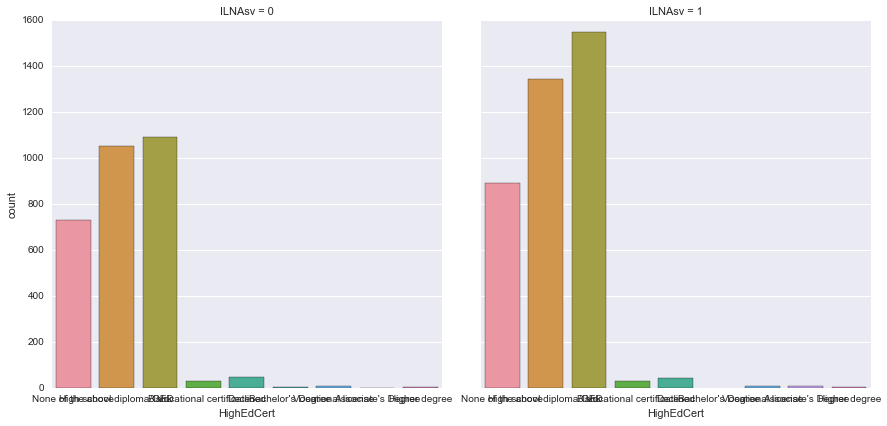

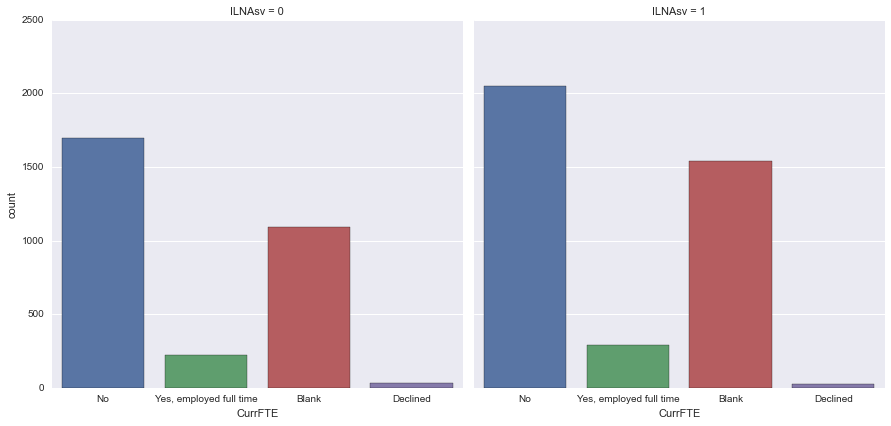

...

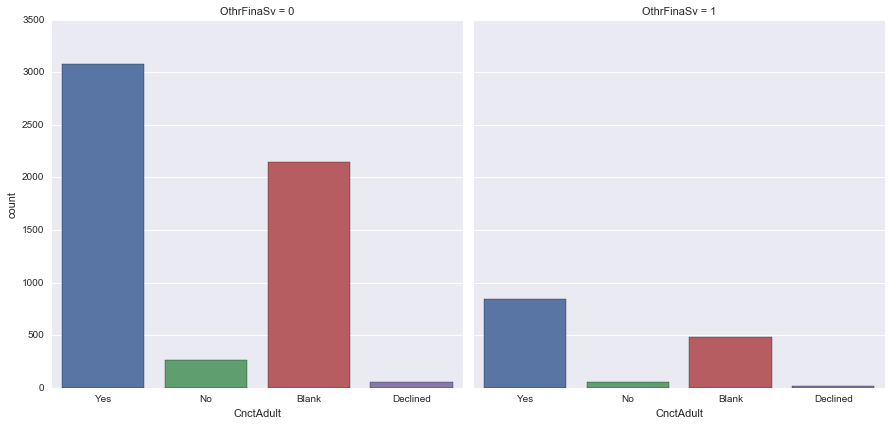

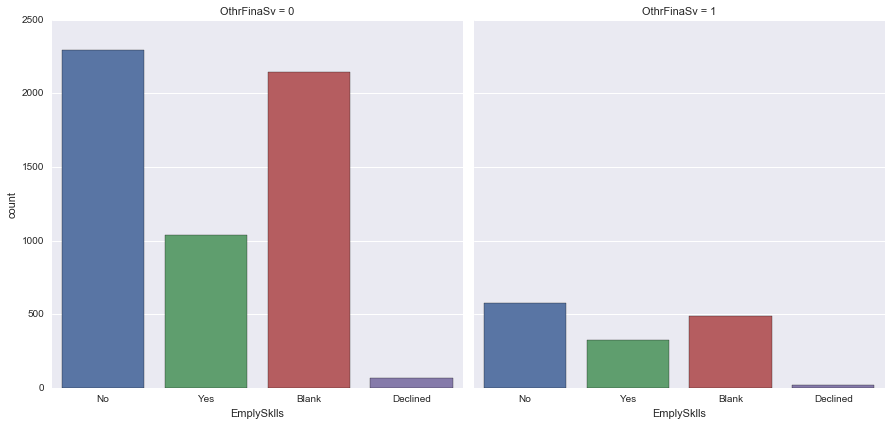

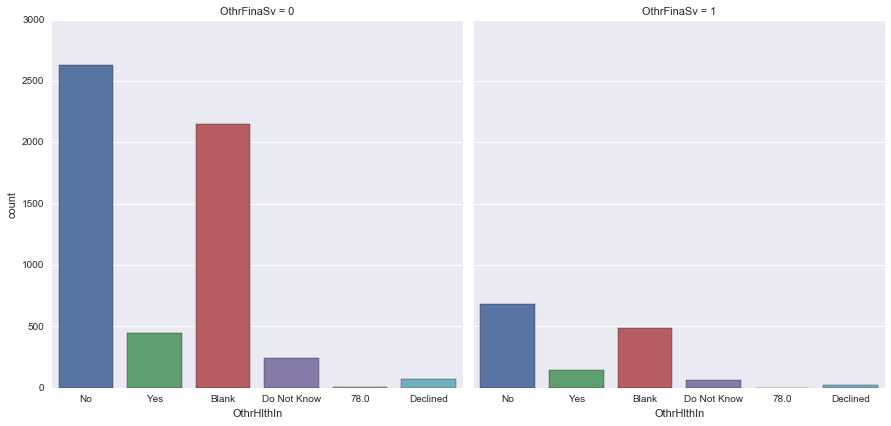

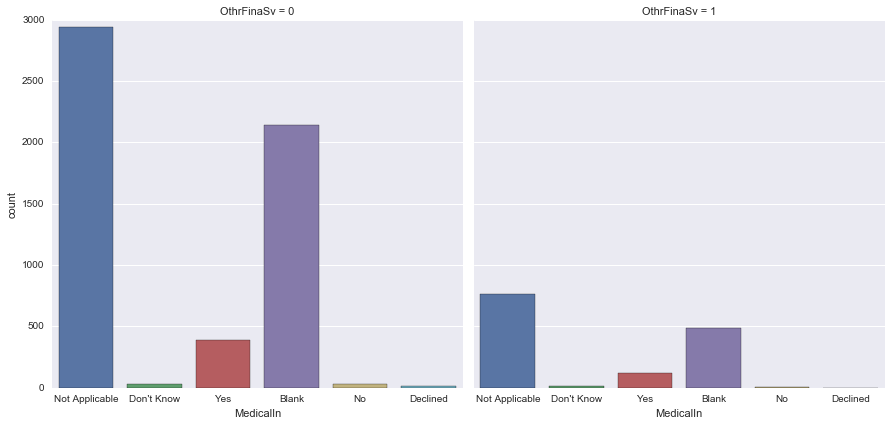

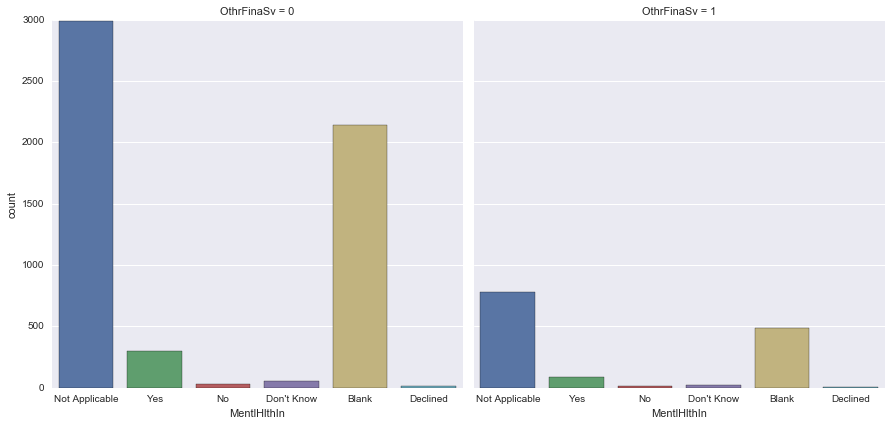

In [126]:
# Features by Targets

for services in features_sub:
    for outcomes in targets:
        sns.factorplot(outcomes, col=services, col_wrap=4, data=cohort_1, kind="count", size=6, aspect=1)

In [135]:
for services in features_sub:
    for outcomes in targets:

        test_3 = test_of_ass(features_sub[services], targets[outcomes])
        
        hypoStatements(services,outcomes)
        print
        print test_3.print_results()
        print
        print ('----------')

H0: Distributions of PubFoodAs DO NOT differ based on ILNAsv of foster youth.
HA: Distributions of PubFoodAs DO differ based on ILNAsv of foster youth.
Significance Level = 0.01

P-value is less than significance level. Therefore, the null hypothesis CAN be rejected.
p-value: 3.71053981558e-05

----------
H0: Distributions of PubHousAs DO NOT differ based on ILNAsv of foster youth.
HA: Distributions of PubHousAs DO differ based on ILNAsv of foster youth.
Significance Level = 0.01

P-value is less than significance level. Therefore, the null hypothesis CAN be rejected.
p-value: 0.000106298865641

----------
H0: Distributions of OthrFinAs DO NOT differ based on ILNAsv of foster youth.
HA: Distributions of OthrFinAs DO differ based on ILNAsv of foster youth.
Significance Level = 0.01

P-value is greater than significance level. Therefore, the null hypothesis can NOT be rejected.
p-value: 0.0266852294481

----------
H0: Distributions of HighEdCert DO NOT differ based on ILNAsv of foster yo

In [128]:
# Number of Services by targets

# # Create column for number of services received in targets table

targ_sub = targets.copy()
targ_sub['Num_services'] = (services_count == 1).sum()

# Functions for plots of num_services by targ

def set_piv_tab_t(col):
    targ_i = targ_sub[[col,'Num_services']]
    targ_i['Freq_count'] = targ_i[col].apply(add_tally)
    piv_tab = targ_i.pivot_table(index=['Num_services',col], values='Freq_count', aggfunc=np.sum)
    piv_tab = piv_tab.reset_index()
    
    return piv_tab


/Users/cguy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


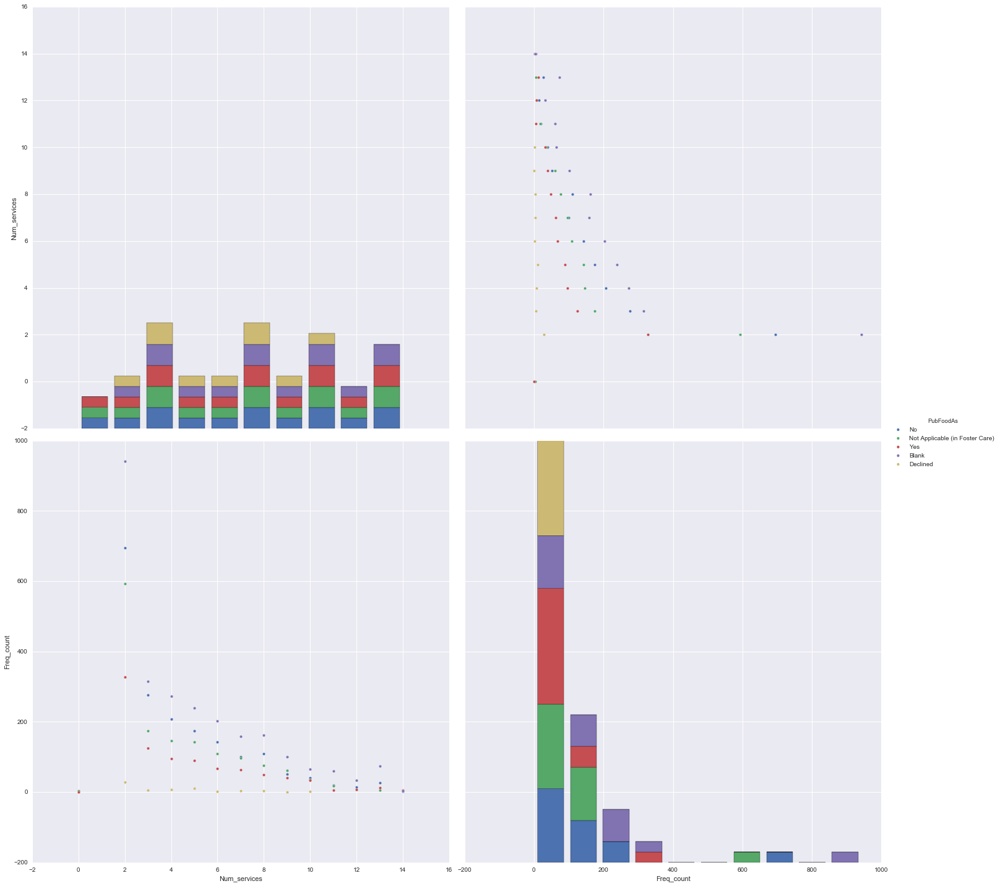

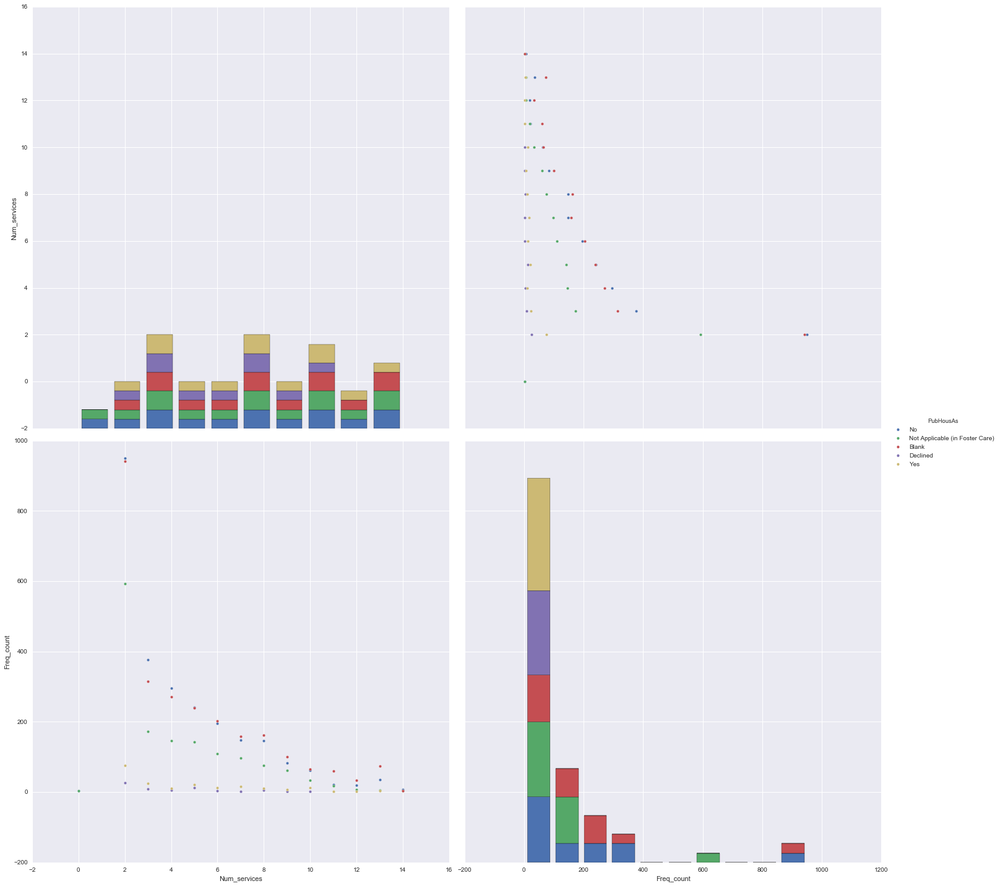

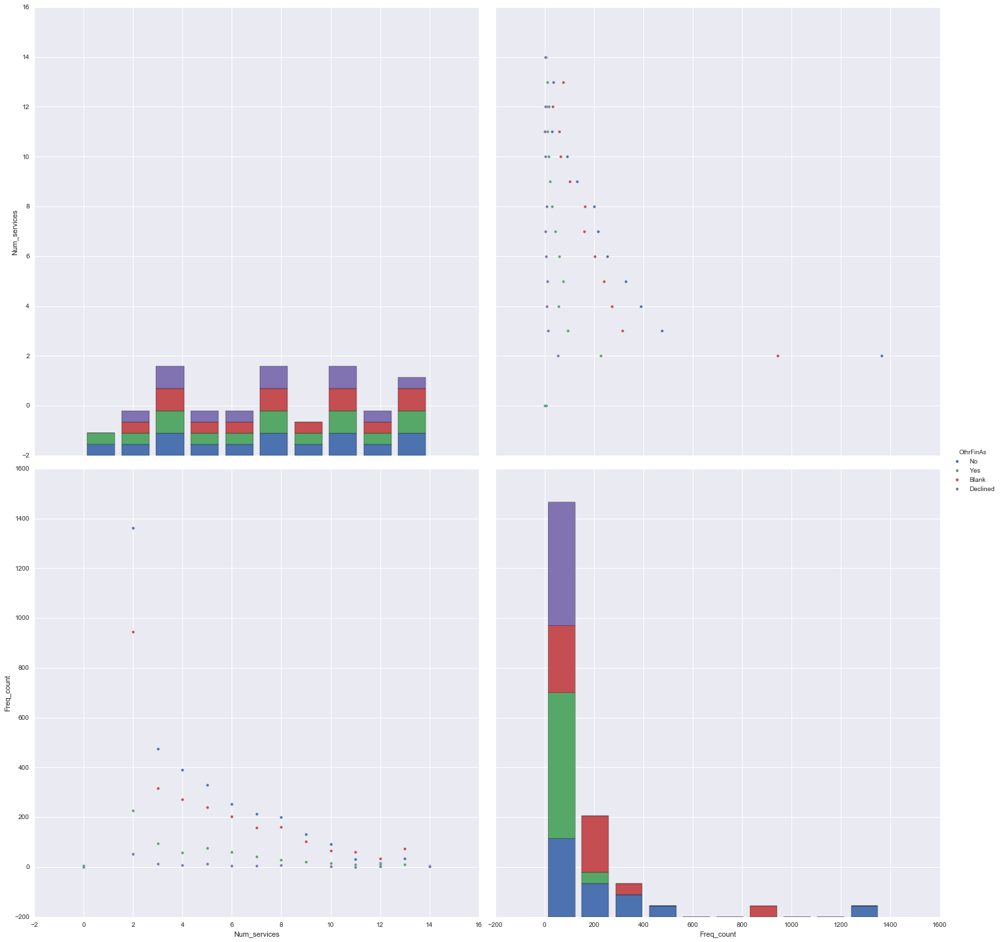

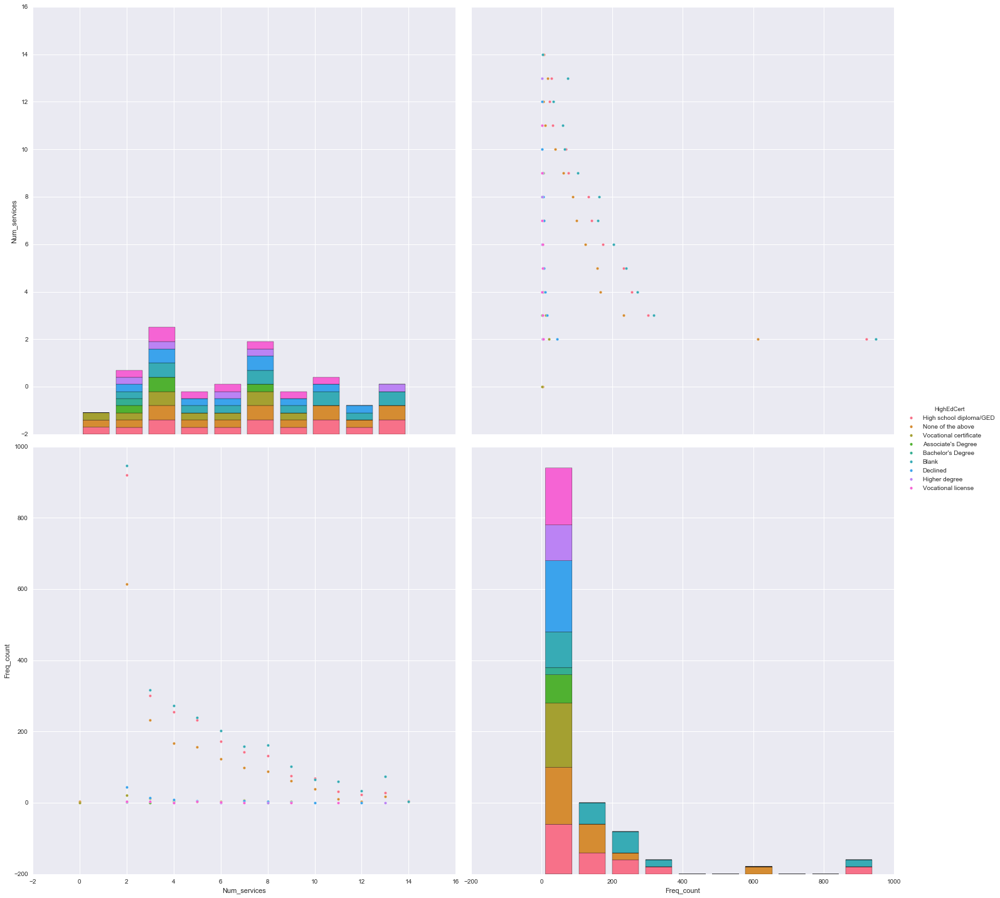

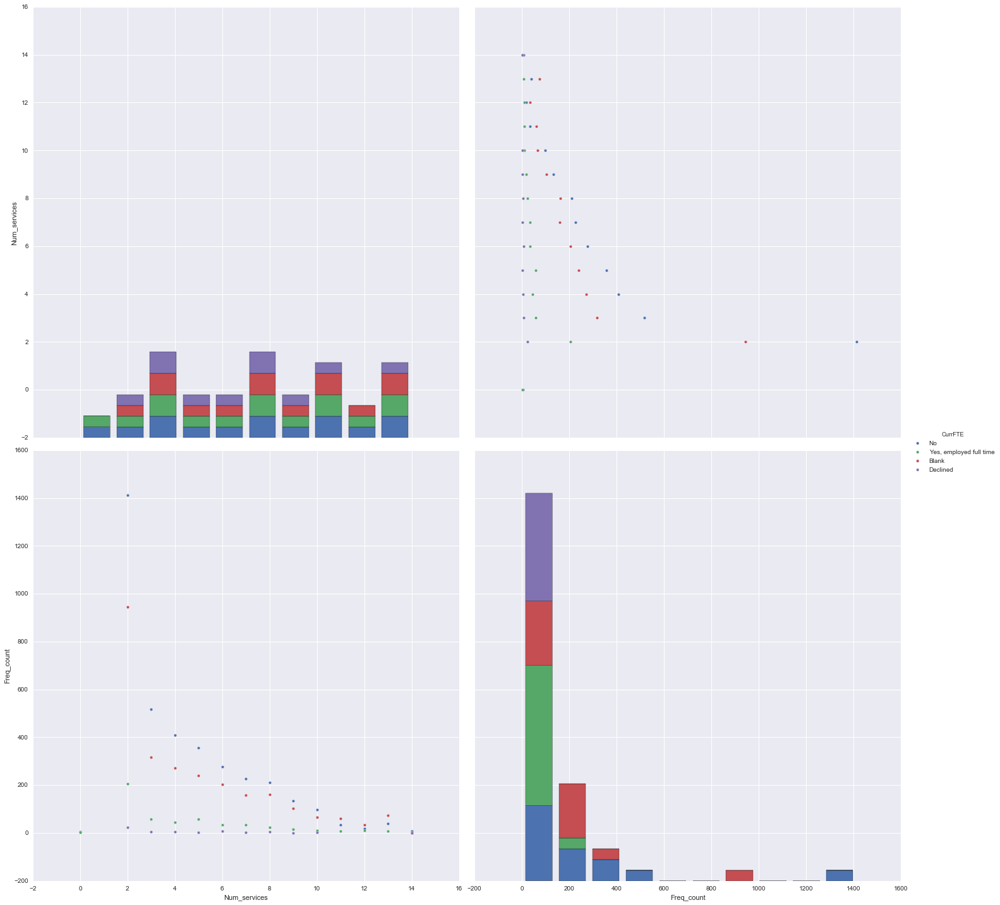

...

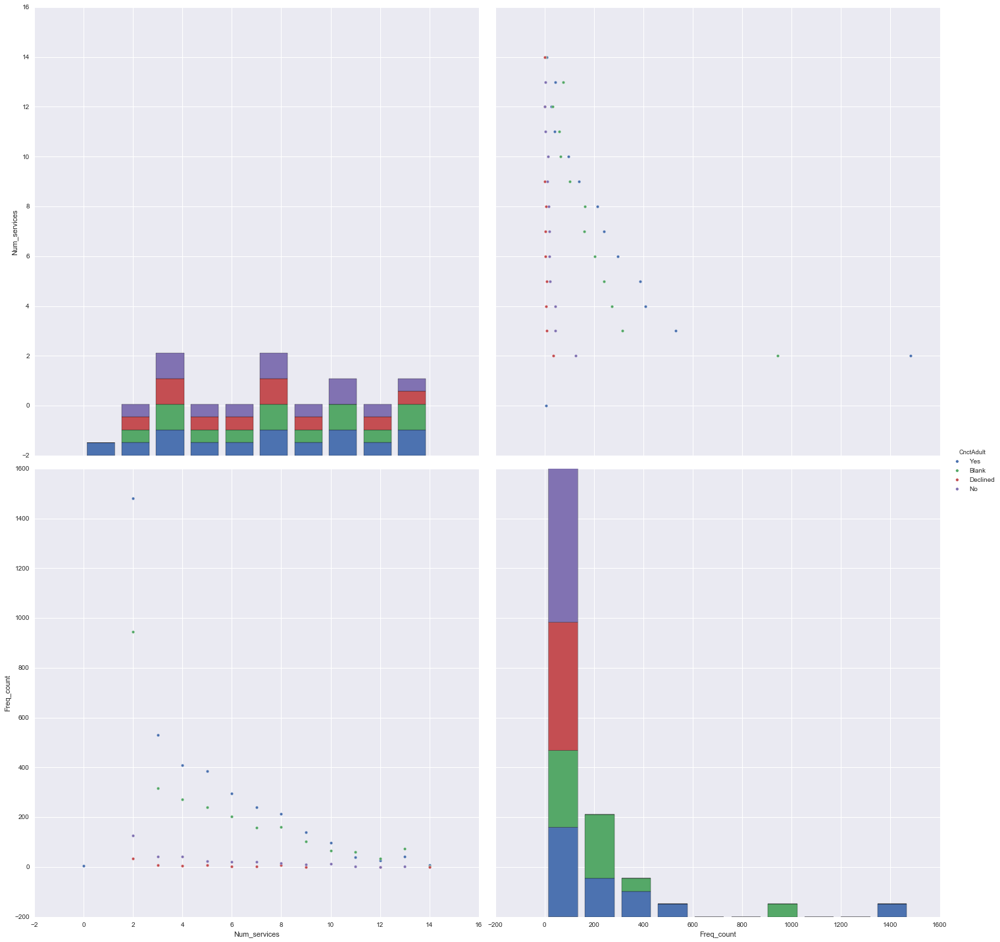

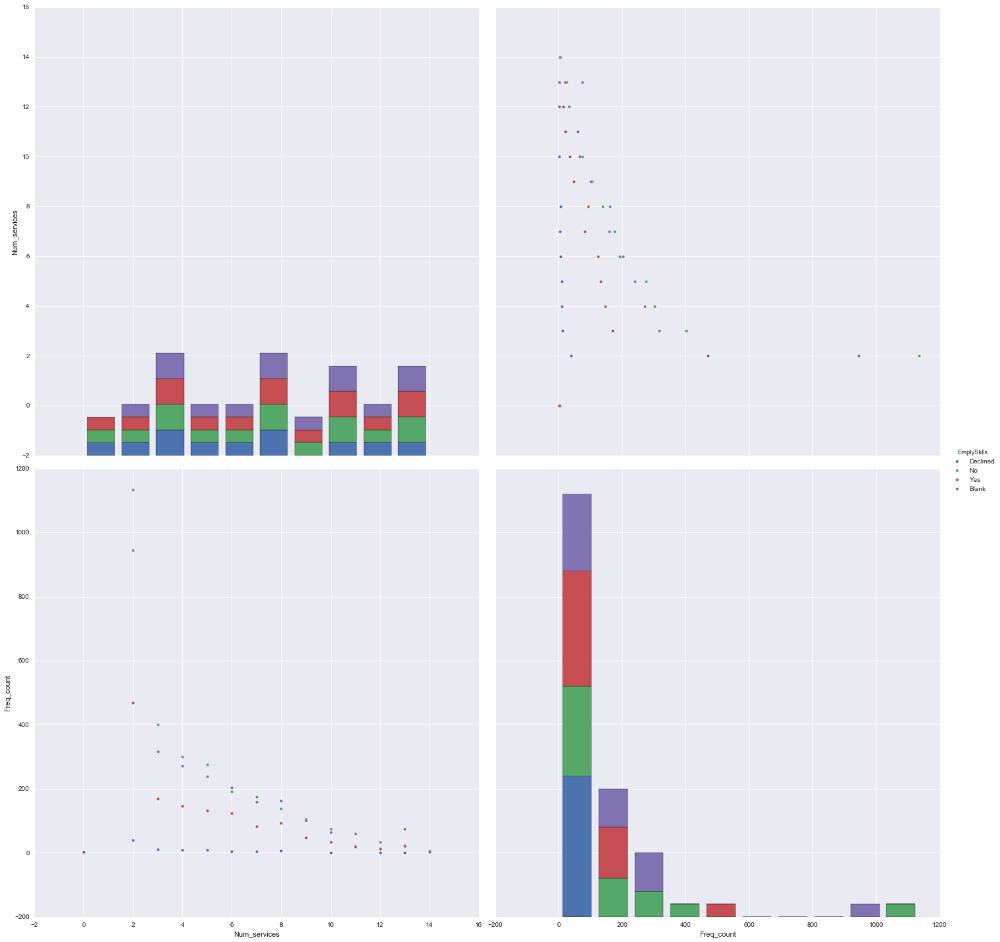

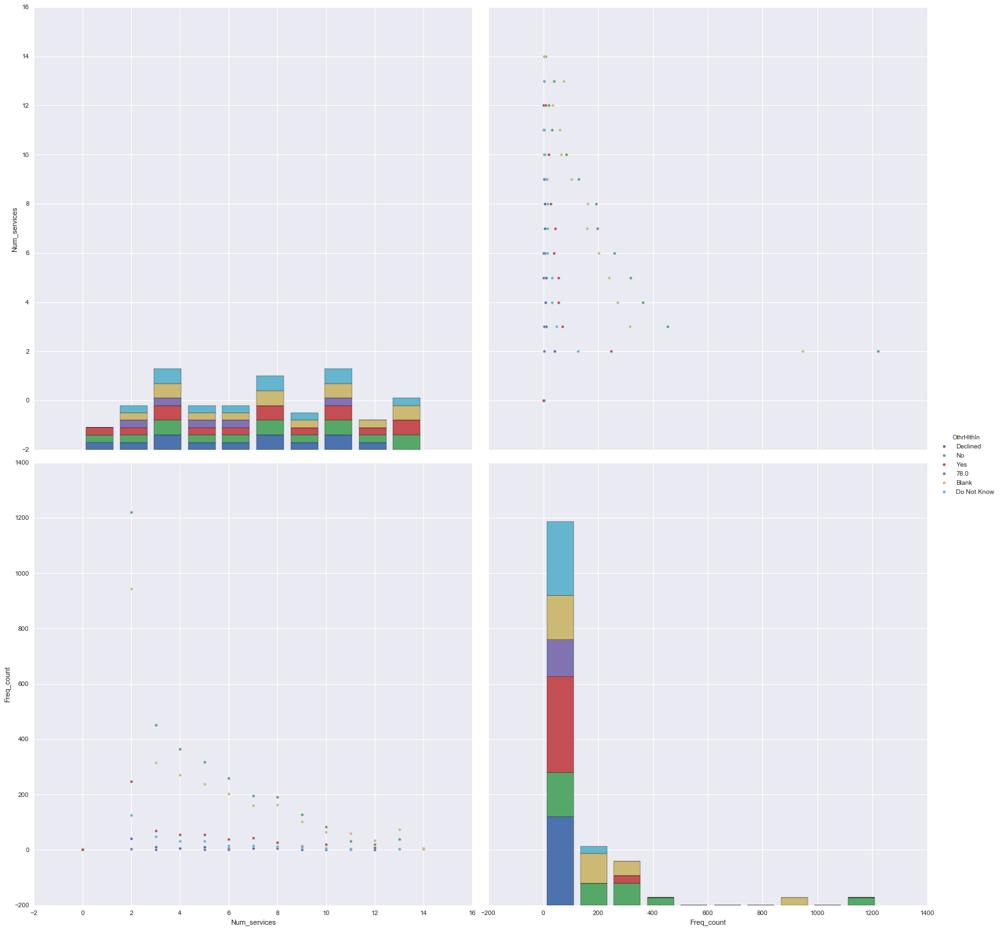

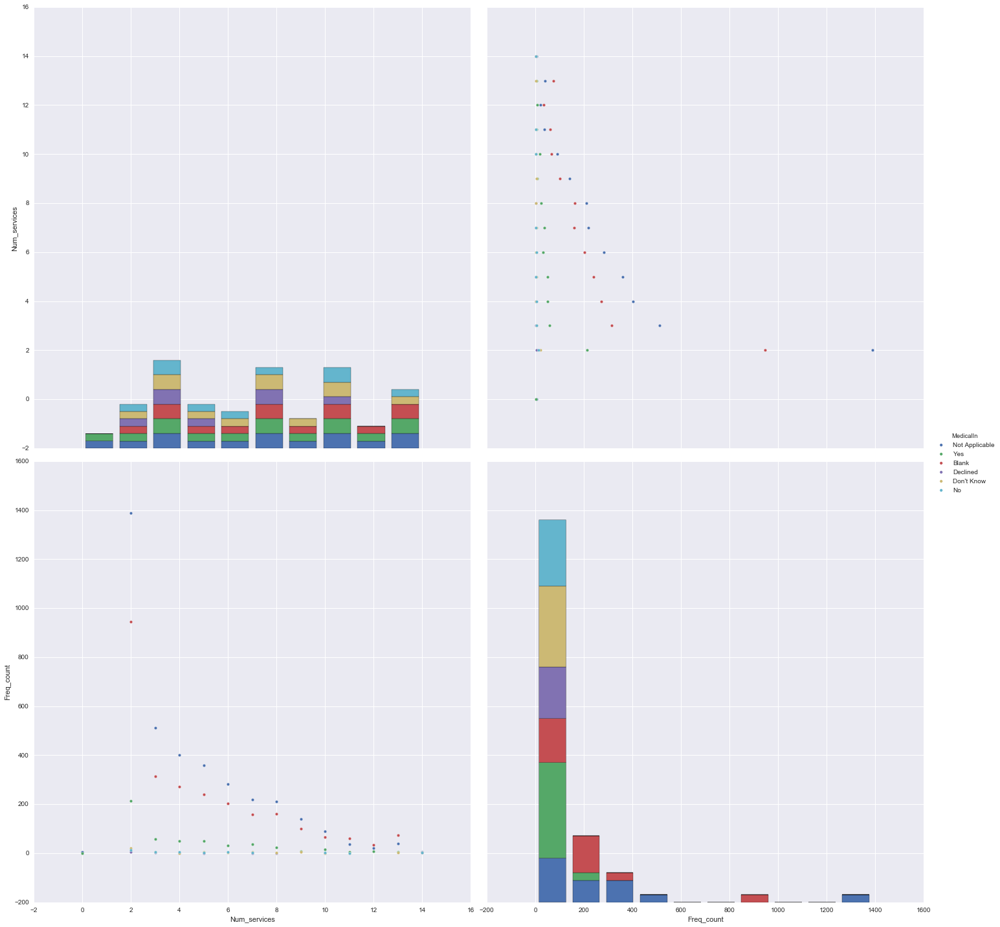

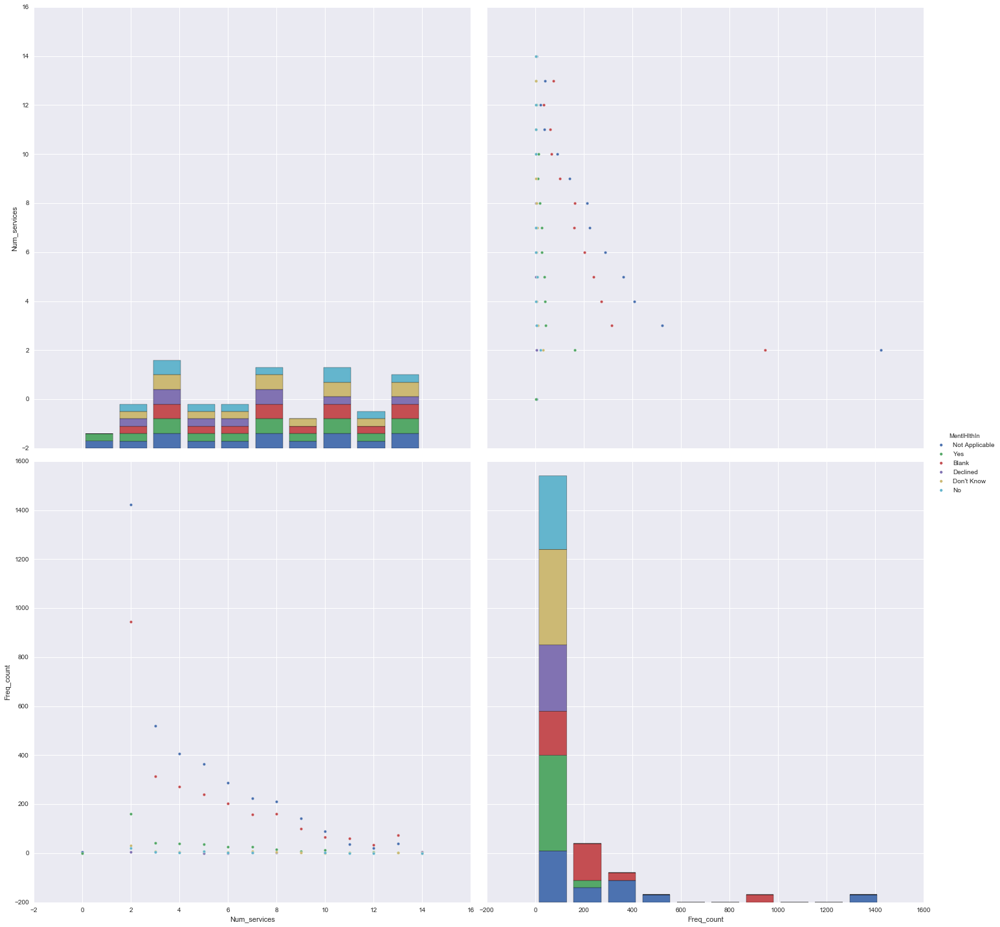

In [129]:
for col in targets:
    create_ns_plot(col, set_piv_tab_t(col))


In [149]:
features_all = cohort_1[['ILNAsv','AcSuppSv','PSEdSuppSv','CareerSv','EmplyTrSv','BudgetSv','HousEdSv','HlthEdSv',\
                     'FamSuppSv','MentorSv','SILsv','RmBrdFASv','EducFinaSv','OthrFinaSv',\
                    'St','DelinqntSv','Sex','Race','TribeSv','EdLevlSv','SpecEdSv','RaceEthn']]

# Saving dataset for later use in analysis

In [146]:
targets.to_csv('cohort1_targets_FV.csv')

In [150]:
features_all.to_csv('cohort1_features_FV.csv')

In [148]:
demographics.to_csv('cohort1_demographics_FV.csv')